# Capstone Group-1

Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.io as pio
import datetime as dt
import warnings
warnings.filterwarnings('ignore')

C:\Users\Sashank\AppData\Local\Temp\ipykernel_24188\1320376941.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


Reading .csv data file and assigning it to variable df

In [2]:
df=pd.read_csv(r"D:\Sashank\Downloads\online_retail_II.csv")

Creating a Copy

In [3]:
df_c=df.copy()

First 5 rows

In [4]:
df_c.head()

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-12-01 07:45:00,6.95,13085.0,United Kingdom
1,489434,79323P,PINK CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085.0,United Kingdom
2,489434,79323W,WHITE CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085.0,United Kingdom
3,489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48,2009-12-01 07:45:00,2.10,13085.0,United Kingdom
4,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,2009-12-01 07:45:00,1.25,13085.0,United Kingdom


Shape of the Data

In [5]:
print('Number of rows:',df_c.shape[0])
print('Number of columns:',df_c.shape[1])

Number of rows: 1067371
Number of columns: 8


General information about the data

In [6]:
df_c.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1067371 entries, 0 to 1067370
Data columns (total 8 columns):
 #   Column       Non-Null Count    Dtype  
---  ------       --------------    -----  
 0   Invoice      1067371 non-null  object 
 1   StockCode    1067371 non-null  object 
 2   Description  1062989 non-null  object 
 3   Quantity     1067371 non-null  int64  
 4   InvoiceDate  1067371 non-null  object 
 5   Price        1067371 non-null  float64
 6   Customer ID  824364 non-null   float64
 7   Country      1067371 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 65.1+ MB


In [7]:
df_c.describe().T

,count,mean,std,min,25%,50%,75%,max
Quantity,1067371.0,9.938898,172.705794,-80995.00,1.00,3.0,10.00,80995.0
Price,1067371.0,4.649388,123.553059,-53594.36,1.25,2.1,4.15,38970.0
Customer ID,824364.0,15324.638504,1697.464450,12346.00,13975.00,15255.0,16797.00,18287.0


In [8]:
df_c.describe(include=object).T

,count,unique,top,freq
Invoice,1067371,53628,537434,1350
StockCode,1067371,5305,85123A,5829
Description,1062989,5698,WHITE HANGING HEART T-LIGHT HOLDER,5918
InvoiceDate,1067371,47635,2010-12-06 16:57:00,1350
Country,1067371,43,United Kingdom,981330


In [9]:
top_5_prod=df_c['Description'].value_counts().sort_values(ascending=False).head(5)
top_5_prod

Description
WHITE HANGING HEART T-LIGHT HOLDER    5918
REGENCY CAKESTAND 3 TIER              4412
JUMBO BAG RED RETROSPOT               3469
ASSORTED COLOUR BIRD ORNAMENT         2958
PARTY BUNTING                         2765
Name: count, dtype: int64

In [15]:
x=px.bar(x=(top_5_prod.index),y=top_5_prod.values,color=top_5_prod.index)

x.update_layout(
    xaxis_title="Product",
    yaxis_title="Count",title='Top 5 product')


In [16]:
top_5_coun=df_c['Country'].value_counts().sort_values(ascending=False).head()
top_5_coun

Country
United Kingdom    981330
EIRE               17866
Germany            17624
France             14330
Netherlands         5140
Name: count, dtype: int64

In [17]:
x=px.bar(x=top_5_coun.index,y=top_5_coun.values,color=top_5_coun.index)

x.update_layout(
    xaxis_title="Product",
    yaxis_title="Count"
)

# Preparing the data

Variable 'Invoice' is a 6-digit integral number but here it is type object

we need to check


In [18]:
df_c[(df_c['Invoice'].str.isnumeric())]

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-12-01 07:45:00,6.95,13085.0,United Kingdom
1,489434,79323P,PINK CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085.0,United Kingdom
2,489434,79323W,WHITE CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085.0,United Kingdom
3,489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48,2009-12-01 07:45:00,2.10,13085.0,United Kingdom
4,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,2009-12-01 07:45:00,1.25,13085.0,United Kingdom
...,...,...,...,...,...,...,...,...
1067366,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680.0,France
1067367,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680.0,France
1067368,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680.0,France
1067369,581587,22138,BAKING SET 9 PIECE RETROSPOT,3,2011-12-09 12:50:00,4.95,12680.0,France


In [19]:
df_c[~(df_c['Invoice'].str.isnumeric())]

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country
178,C489449,22087,PAPER BUNTING WHITE LACE,-12,2009-12-01 10:33:00,2.95,16321.0,Australia
179,C489449,85206A,CREAM FELT EASTER EGG BASKET,-6,2009-12-01 10:33:00,1.65,16321.0,Australia
180,C489449,21895,POTTING SHED SOW 'N' GROW SET,-4,2009-12-01 10:33:00,4.25,16321.0,Australia
181,C489449,21896,POTTING SHED TWINE,-6,2009-12-01 10:33:00,2.10,16321.0,Australia
182,C489449,22083,PAPER CHAIN KIT RETRO SPOT,-12,2009-12-01 10:33:00,2.95,16321.0,Australia
...,...,...,...,...,...,...,...,...
1065910,C581490,23144,ZINC T-LIGHT HOLDER STARS SMALL,-11,2011-12-09 09:57:00,0.83,14397.0,United Kingdom
1067002,C581499,M,Manual,-1,2011-12-09 10:28:00,224.69,15498.0,United Kingdom
1067176,C581568,21258,VICTORIAN SEWING BOX LARGE,-5,2011-12-09 11:57:00,10.95,15311.0,United Kingdom
1067177,C581569,84978,HANGING HEART JAR T-LIGHT HOLDER,-1,2011-12-09 11:58:00,1.25,17315.0,United Kingdom


There are 19500 records for which 'Invoice' starts with C whic means the order is canceled

separating the canceled and order Invoice

In [20]:
df_cancelled=df_c[~(df_c['Invoice'].str.isnumeric())]

In [21]:
df_cancelled.shape

(19500, 8)

In [22]:
df_order=df_c[(df_c['Invoice'].str.isnumeric())]

In [23]:
df_order.shape

(1047871, 8)

checking for -ve values in order quantity

In [24]:
df_order[df_order['Quantity']<=0]

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country
263,489464,21733,85123a mixed,-96,2009-12-01 10:52:00,0.0,NaN,United Kingdom
283,489463,71477,short,-240,2009-12-01 10:52:00,0.0,NaN,United Kingdom
284,489467,85123A,21733 mixed,-192,2009-12-01 10:53:00,0.0,NaN,United Kingdom
470,489521,21646,NaN,-50,2009-12-01 11:44:00,0.0,NaN,United Kingdom
3114,489655,20683,NaN,-44,2009-12-01 17:26:00,0.0,NaN,United Kingdom
...,...,...,...,...,...,...,...,...
1060794,581210,23395,check,-26,2011-12-07 18:36:00,0.0,NaN,United Kingdom
1060796,581212,22578,lost,-1050,2011-12-07 18:38:00,0.0,NaN,United Kingdom
1060797,581213,22576,check,-30,2011-12-07 18:38:00,0.0,NaN,United Kingdom
1062371,581226,23090,missing,-338,2011-12-08 09:56:00,0.0,NaN,United Kingdom


There are 3457 -ve values in quantity whic mean either the product is removed from invoice or the invoice is canceled
we'll remove the records with -ve quantity values from the order table

In [25]:
df_order=df_order[df_order['Quantity']>0]

In [26]:
df_order.shape

(1044414, 8)

after separating canceled invoices and removing the -ve quantity values we are left with 1044414 rows and 8 columns

In [27]:
df_order.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1044414 entries, 0 to 1067370
Data columns (total 8 columns):
 #   Column       Non-Null Count    Dtype  
---  ------       --------------    -----  
 0   Invoice      1044414 non-null  object 
 1   StockCode    1044414 non-null  object 
 2   Description  1042721 non-null  object 
 3   Quantity     1044414 non-null  int64  
 4   InvoiceDate  1044414 non-null  object 
 5   Price        1044414 non-null  float64
 6   Customer ID  805620 non-null   float64
 7   Country      1044414 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 71.7+ MB


now we can chang the type of column Invoice to integer

In [28]:
df_order['Invoice']=df_order['Invoice'].astype(int)

In [29]:
df_order.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1044414 entries, 0 to 1067370
Data columns (total 8 columns):
 #   Column       Non-Null Count    Dtype  
---  ------       --------------    -----  
 0   Invoice      1044414 non-null  int32  
 1   StockCode    1044414 non-null  object 
 2   Description  1042721 non-null  object 
 3   Quantity     1044414 non-null  int64  
 4   InvoiceDate  1044414 non-null  object 
 5   Price        1044414 non-null  float64
 6   Customer ID  805620 non-null   float64
 7   Country      1044414 non-null  object 
dtypes: float64(2), int32(1), int64(1), object(4)
memory usage: 67.7+ MB


Now we'll look into variable StockCode, which should be a 5-digit integral number uniquely assigned to each distinct product

In [30]:
df_order[~(df_order['StockCode'].str.len()==5)]

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country
1,489434,79323P,PINK CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085.0,United Kingdom
2,489434,79323W,WHITE CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085.0,United Kingdom
12,489436,48173C,DOOR MAT BLACK FLOCK,10,2009-12-01 09:06:00,5.95,13078.0,United Kingdom
23,489436,35004B,SET OF 3 BLACK FLYING DUCKS,12,2009-12-01 09:06:00,4.65,13078.0,United Kingdom
28,489436,84596F,SMALL MARSHMALLOWS PINK BOWL,8,2009-12-01 09:06:00,1.25,13078.0,United Kingdom
...,...,...,...,...,...,...,...,...
1067270,581579,85099C,JUMBO BAG BAROQUE BLACK WHITE,10,2011-12-09 12:19:00,1.79,17581.0,United Kingdom
1067302,581580,84993A,75 GREEN PETIT FOUR CASES,2,2011-12-09 12:20:00,0.42,12748.0,United Kingdom
1067308,581580,85049A,TRADITIONAL CHRISTMAS RIBBONS,1,2011-12-09 12:20:00,1.25,12748.0,United Kingdom
1067317,581580,85049E,SCANDINAVIAN REDS RIBBONS,2,2011-12-09 12:20:00,1.25,12748.0,United Kingdom


There are 130363 records with more than 5 numbers or less than in the StockCode, which means there are sub categorries in the stock like its different in colour or different in size or differently labled.

we try to create a new column for the subcategory in the stock id

In [31]:
df_order['Stock_subcat'] = None

# Use boolean indexing to update the 'Stock_subcat' column based on conditions
df_order.loc[df_order['StockCode'].str.len() < 5, 'Stock_subcat'] = df_order['StockCode']
df_order.loc[df_order['StockCode'].str.len() > 5, 'Stock_subcat'] = df_order['StockCode'].str[5:]

# Optionally, assign None where length is exactly 5
df_order.loc[df_order['StockCode'].str.len() == 5, 'Stock_subcat'] = None

In [32]:
df_order

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,Stock_subcat
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-12-01 07:45:00,6.95,13085.0,United Kingdom,None
1,489434,79323P,PINK CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085.0,United Kingdom,P
2,489434,79323W,WHITE CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085.0,United Kingdom,W
3,489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48,2009-12-01 07:45:00,2.10,13085.0,United Kingdom,None
4,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,2009-12-01 07:45:00,1.25,13085.0,United Kingdom,None
...,...,...,...,...,...,...,...,...,...
1067366,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680.0,France,None
1067367,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680.0,France,None
1067368,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680.0,France,None
1067369,581587,22138,BAKING SET 9 PIECE RETROSPOT,3,2011-12-09 12:50:00,4.95,12680.0,France,None


Analyzing  the column Stock_subcat

number od unique subcats

In [33]:

len(df_order['Stock_subcat'].unique())

80

There are 80 unique sub categories

unique sub categories

In [34]:

df_order['Stock_subcat'].unique()

array([None, 'P', 'W', 'C', 'B', 'F', 'L', 'S', 'A', 'N', 'POST', 'E',
       'J', 'D', 'G', 'LP', 'BL', 'K', 'H', 'M', '058', '068', 'DOT', 'U',
       'b', 'w', 'c', 'a', 'f', 'bl', 's', 'p', 'GR', 'R', 'V', '004',
       '076', 'C2', 'T', 'CHARGES', '003', 'I', 'O', 'Z', '01', '0001_80',
       '072', '0001_20', '044', '02', '0001_10', '0001_50', '066N', 'm',
       '0001_30', 'PADS', 'e', 'd', '0001_40', '0001_60', '0001_70',
       '0001_90', 'k', 'g', '069', '070', '075', 'j', 'l', '041', 'n',
       '037', 'BOY', 'GIRL', 'T2', 'J ', '2', '062', 'Y', 'NFEE'],
      dtype=object)

Studying the sub categories

In [35]:
df_order[df_order['Stock_subcat']=='NFEE'].head()

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,Stock_subcat
440698,531411,AMAZONFEE,AMAZON FEE,1,2010-11-08 10:11:00,6706.71,NaN,United Kingdom,NFEE
517955,537632,AMAZONFEE,AMAZON FEE,1,2010-12-07 15:08:00,13541.33,NaN,United Kingdom,NFEE
540478,537632,AMAZONFEE,AMAZON FEE,1,2010-12-07 15:08:00,13541.33,NaN,United Kingdom,NFEE
660995,547901,AMAZONFEE,AMAZON FEE,1,2011-03-28 11:57:00,219.76,NaN,United Kingdom,NFEE


In [36]:
df_order[df_order['Stock_subcat']=='CHARGES'].head()

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,Stock_subcat
18466,490948,BANK CHARGES,Bank Charges,1,2009-12-08 14:29:00,15.0,16805.0,United Kingdom,CHARGES
94431,498269,BANK CHARGES,Bank Charges,1,2010-02-17 15:03:00,15.0,16928.0,United Kingdom,CHARGES
148098,503497,BANK CHARGES,Bank Charges,1,2010-04-01 12:07:00,15.0,17539.0,United Kingdom,CHARGES
153573,503960,BANK CHARGES,Bank Charges,1,2010-04-08 16:50:00,15.0,12843.0,United Kingdom,CHARGES
167424,505204,BANK CHARGES,Bank Charges,1,2010-04-20 16:24:00,15.0,17448.0,United Kingdom,CHARGES


on further analysis we came to know that there are some StockCodes whic are not related to any products but they are additional charges like postal charges, shipment charges, charges by the service providers, bank charges and more, which dosent contribute to our analysis. 

Removing un wanted StockCode

In [37]:
df_order['Stock_subcat'].unique()

array([None, 'P', 'W', 'C', 'B', 'F', 'L', 'S', 'A', 'N', 'POST', 'E',
       'J', 'D', 'G', 'LP', 'BL', 'K', 'H', 'M', '058', '068', 'DOT', 'U',
       'b', 'w', 'c', 'a', 'f', 'bl', 's', 'p', 'GR', 'R', 'V', '004',
       '076', 'C2', 'T', 'CHARGES', '003', 'I', 'O', 'Z', '01', '0001_80',
       '072', '0001_20', '044', '02', '0001_10', '0001_50', '066N', 'm',
       '0001_30', 'PADS', 'e', 'd', '0001_40', '0001_60', '0001_70',
       '0001_90', 'k', 'g', '069', '070', '075', 'j', 'l', '041', 'n',
       '037', 'BOY', 'GIRL', 'T2', 'J ', '2', '062', 'Y', 'NFEE'],
      dtype=object)

There are 1893 records which represent postal charges

In [38]:
len(df_order[df_order['Stock_subcat']=='POST'])

1893

In [39]:
df_order=df_order[~(df_order['Stock_subcat']=='POST')]

There are 1443 records which represent DOTCOM POSTAGE charges

In [40]:
len(df_order[df_order['Stock_subcat']=='DOT'])

1443

In [41]:
df_order=df_order[~(df_order['Stock_subcat']=='DOT')]

There are 275 records which represent CARRIAGE charges

In [42]:
len(df_order[df_order['Stock_subcat']=='C2'])

275

In [43]:
df_order=df_order[~(df_order['Stock_subcat']=='C2')]

There are 36 records with StockCode as ADJUST, which are adjustment in the invoise made by the seller

In [44]:
len(df_order[df_order['StockCode']=='ADJUST'])

36

In [45]:
df_order=df_order[~(df_order['StockCode']=='ADJUST')]

There are 18 records with StockCode as Pads, which reffers to pads in packing

In [46]:
len(df_order[df_order['Stock_subcat']=='PADS'])

18

In [47]:
df_order=df_order[~(df_order['StockCode']=='PADS')]

In [48]:
len(df_order[df_order['StockCode']=='ADJUST2'])

3

In [49]:
df_order=df_order[~(df_order['StockCode']=='ADJUST2')]

In [50]:
len(df_order[df_order['Stock_subcat']=='NFEE'])

4

In [51]:
df_order=df_order[~(df_order['Stock_subcat']=='NFEE')]

In [52]:
len(df_order[df_order['Stock_subcat']=='CHARGES'])

35

In [53]:
df_order=df_order[~(df_order['Stock_subcat']=='CHARGES')]

In [54]:
len(df_order['Stock_subcat'].unique())

73

In [55]:
df_order.shape

(1040707, 9)

after removing the aditional charges we are left with 73 subcategories and 1040707 records and 9 columns

In [56]:
df_order['Stock_subcat'].unique()

array([None, 'P', 'W', 'C', 'B', 'F', 'L', 'S', 'A', 'N', 'E', 'J', 'D',
       'G', 'LP', 'BL', 'K', 'H', 'M', '058', '068', 'U', 'b', 'w', 'c',
       'a', 'f', 'bl', 's', 'p', 'GR', 'R', 'V', '004', '076', 'T', '003',
       'I', 'O', 'Z', '01', '0001_80', '072', '0001_20', '044', '02',
       '0001_10', '0001_50', '066N', 'm', '0001_30', 'e', 'd', '0001_40',
       '0001_60', '0001_70', '0001_90', 'k', 'g', '069', '070', '075',
       'j', 'l', '041', 'n', '037', 'BOY', 'GIRL', 'J ', '2', '062', 'Y'],
      dtype=object)

we can see that there are mixed cases in subcats some are capital and some are small, we'll convert all into single case

In [57]:
df_order['Stock_subcat']=(df_order['Stock_subcat'].str.upper())

In [58]:
df_order['Stock_subcat'].unique()

array([None, 'P', 'W', 'C', 'B', 'F', 'L', 'S', 'A', 'N', 'E', 'J', 'D',
       'G', 'LP', 'BL', 'K', 'H', 'M', '058', '068', 'U', 'GR', 'R', 'V',
       '004', '076', 'T', '003', 'I', 'O', 'Z', '01', '0001_80', '072',
       '0001_20', '044', '02', '0001_10', '0001_50', '066N', '0001_30',
       '0001_40', '0001_60', '0001_70', '0001_90', '069', '070', '075',
       '041', '037', 'BOY', 'GIRL', 'J ', '2', '062', 'Y'], dtype=object)

In [59]:
len(df_order['Stock_subcat'].unique())

57

Now we are down to 57 subcats

There are some test products in the list which are not the actual products anymore, and it is denoted with TEST in StockCode

In [60]:
len(df_order[df_order['StockCode'].str.startswith('TEST')])

13

There are 13 such products. we'll remove those

In [61]:
df_order=df_order[~(df_order['StockCode'].str.startswith('TEST'))]

In [62]:
df_order['Stock_subcat'].unique()

array([None, 'P', 'W', 'C', 'B', 'F', 'L', 'S', 'A', 'N', 'E', 'J', 'D',
       'G', 'LP', 'BL', 'K', 'H', 'M', '058', '068', 'U', 'GR', 'R', 'V',
       '004', '076', 'T', '003', 'I', 'O', 'Z', '0001_80', '072',
       '0001_20', '044', '0001_10', '0001_50', '066N', '0001_30',
       '0001_40', '0001_60', '0001_70', '0001_90', '069', '070', '075',
       '041', '037', 'BOY', 'GIRL', 'J ', '2', '062', 'Y'], dtype=object)

In [63]:
len(df_order['Stock_subcat'].unique())

55

Now we are with 55 subcats.

further we'll try to prosess the StockCode which starts with alphabets

In [64]:
df_order[df_order['StockCode'].str.contains('^[A-Za-z]')].shape

(1127, 9)

There are 1127 such records where the StockCode starts with an alphabet

In [65]:
len(df_order[df_order['StockCode'].str.contains('^[A-Za-z]')]['StockCode'].unique())

30

there are 30 such unique StockCode

In [66]:
df_order[df_order['StockCode'].str.contains('^[A-Za-z]')]['StockCode'].unique()

array(['DCGS0058', 'DCGS0068', 'M', 'DCGS0004', 'DCGS0076', 'DCGS0003',
       'gift_0001_80', 'DCGS0072', 'gift_0001_20', 'DCGS0044',
       'gift_0001_10', 'gift_0001_50', 'DCGS0066N', 'gift_0001_30',
       'gift_0001_40', 'gift_0001_60', 'gift_0001_70', 'gift_0001_90',
       'm', 'DCGS0069', 'DCGS0070', 'DCGS0075', 'D', 'S', 'DCGS0041',
       'DCGS0037', 'DCGSSBOY', 'DCGSSGIRL', 'SP1002', 'DCGS0062'],
      dtype=object)

Now we'll look into those values

In [67]:
df_order[(df_order['StockCode']==('M'or 'm'))]

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,Stock_subcat
2697,489609,M,Manual,1,2009-12-01 14:50:00,4.00,NaN,United Kingdom,M
11310,490300,M,Manual,1,2009-12-04 14:19:00,0.85,12970.0,United Kingdom,M
11311,490300,M,Manual,1,2009-12-04 14:19:00,0.21,12970.0,United Kingdom,M
16107,490727,M,Manual,1,2009-12-07 16:38:00,0.00,17231.0,United Kingdom,M
17386,490760,M,Manual,1,2009-12-08 09:49:00,10.00,14295.0,United Kingdom,M
...,...,...,...,...,...,...,...,...,...
1051476,580645,M,Manual,1,2011-12-05 13:11:00,219.50,17857.0,United Kingdom,M
1051479,580646,M,Manual,800,2011-12-05 13:13:00,0.25,17857.0,United Kingdom,M
1056337,580884,M,Manual,1,2011-12-06 12:21:00,0.85,15907.0,United Kingdom,M
1056893,580956,M,Manual,4,2011-12-06 14:23:00,1.25,17841.0,United Kingdom,M


we found that there are 883 records which are added manually which means we don't know what kind of products are those

In [68]:
df_order=df_order[~(df_order['StockCode']=='M')]

In [69]:
df_order=df_order[~(df_order['StockCode']=='m')]

In [70]:
df_order[df_order['StockCode'].str.contains('^[A-Za-z]')]['StockCode'].unique()

array(['DCGS0058', 'DCGS0068', 'DCGS0004', 'DCGS0076', 'DCGS0003',
       'gift_0001_80', 'DCGS0072', 'gift_0001_20', 'DCGS0044',
       'gift_0001_10', 'gift_0001_50', 'DCGS0066N', 'gift_0001_30',
       'gift_0001_40', 'gift_0001_60', 'gift_0001_70', 'gift_0001_90',
       'DCGS0069', 'DCGS0070', 'DCGS0075', 'D', 'S', 'DCGS0041',
       'DCGS0037', 'DCGSSBOY', 'DCGSSGIRL', 'SP1002', 'DCGS0062'],
      dtype=object)

There are some samples and discounts in stock code, we'll remove those as well

In [71]:
df_order=df_order[~(df_order['StockCode']=='S')]
df_order=df_order[~(df_order['StockCode']=='D')]

there are gift cards in the product

In [72]:
df_order[(df_order['StockCode'].str.startswith('gift'))]

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,Stock_subcat
30620,491968,gift_0001_80,NaN,2,2009-12-14 17:56:00,0.00,NaN,United Kingdom,0001_80
31079,491969,gift_0001_80,Dotcomgiftshop Gift Voucher £80.00,1,2009-12-14 17:57:00,69.56,NaN,United Kingdom,0001_80
32048,491971,gift_0001_20,Dotcomgiftshop Gift Voucher £20.00,2,2009-12-14 18:37:00,17.39,NaN,United Kingdom,0001_20
40904,492782,gift_0001_10,Dotcomgiftshop Gift Voucher £10.00,1,2009-12-18 17:06:00,8.69,NaN,United Kingdom,0001_10
40905,492782,gift_0001_20,Dotcomgiftshop Gift Voucher £20.00,1,2009-12-18 17:06:00,17.39,NaN,United Kingdom,0001_20
...,...,...,...,...,...,...,...,...,...
842962,564761,gift_0001_30,NaN,30,2011-08-30 10:48:00,0.00,NaN,United Kingdom,0001_30
845901,564974,gift_0001_10,Dotcomgiftshop Gift Voucher £10.00,2,2011-08-31 15:32:00,8.33,NaN,United Kingdom,0001_10
847625,565231,gift_0001_30,Dotcomgiftshop Gift Voucher £30.00,1,2011-09-02 09:26:00,25.00,NaN,United Kingdom,0001_30
956810,573585,gift_0001_20,Dotcomgiftshop Gift Voucher £20.00,1,2011-10-31 14:41:00,16.67,NaN,United Kingdom,0001_20


these gift vouchers are points that are given to customer or even the customers have bought the gift card, we can't differntiate which is which

in more than 10L+ records only 99 are gift voucher category. which will not affect the analysis

In [73]:
df_order=df_order[~(df_order['StockCode'].str.startswith('gift'))]

after removing gifts there are 17 more stockcodes which starts with alphabet

In [74]:
len(df_order[df_order['StockCode'].str.contains('^[A-Za-z]')]['StockCode'].unique())

17

In [75]:
df_order[df_order['StockCode'].str.contains('^[A-Za-z]')]['StockCode'].unique()

array(['DCGS0058', 'DCGS0068', 'DCGS0004', 'DCGS0076', 'DCGS0003',
       'DCGS0072', 'DCGS0044', 'DCGS0066N', 'DCGS0069', 'DCGS0070',
       'DCGS0075', 'DCGS0041', 'DCGS0037', 'DCGSSBOY', 'DCGSSGIRL',
       'SP1002', 'DCGS0062'], dtype=object)

there are some stock codes which starts with 'DCGS' 

In [76]:
df_order[(df_order['StockCode'].str.startswith('DCGS'))]

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,Stock_subcat
2377,489597,DCGS0058,MISO PRETTY GUM,1,2009-12-01 14:28:00,0.83,NaN,United Kingdom,058
2378,489597,DCGS0068,DOGS NIGHT COLLAR,1,2009-12-01 14:28:00,8.65,NaN,United Kingdom,068
8371,490074,DCGS0004,HAYNES CAMPER SHOULDER BAG,1,2009-12-03 14:39:00,17.35,NaN,United Kingdom,004
8372,490074,DCGS0058,MISO PRETTY GUM,1,2009-12-03 14:39:00,0.83,NaN,United Kingdom,058
8373,490074,DCGS0076,SUNJAR LED NIGHT NIGHT LIGHT,1,2009-12-03 14:39:00,16.48,NaN,United Kingdom,076
...,...,...,...,...,...,...,...,...,...
843773,564825,DCGSSGIRL,GIRLS PARTY BAG,1,2011-08-30 12:26:00,3.29,NaN,United Kingdom,GIRL
891427,568716,DCGSSBOY,BOYS PARTY BAG,2,2011-09-28 16:13:00,3.29,NaN,United Kingdom,BOY
933664,571931,DCGSSGIRL,GIRLS PARTY BAG,1,2011-10-19 16:59:00,3.29,NaN,United Kingdom,GIRL
1000063,576840,DCGSSGIRL,GIRLS PARTY BAG,1,2011-11-16 15:23:00,3.29,NaN,United Kingdom,GIRL


There are 130 records which start with DCGS, we can't tell where it fits so we are dropping it

In [77]:
df_order=df_order[~(df_order['StockCode'].str.startswith('DCGS'))]

In [78]:
df_order[df_order['StockCode'].str.contains('^[A-Za-z]')]['StockCode'].unique()

array(['SP1002'], dtype=object)

In [79]:
df_order=df_order[~(df_order['StockCode']=='SP1002')]

now we check the subcats

In [80]:
len(df_order['Stock_subcat'].unique())

29

now after treating the stock code and sub categories we are down to 29 unique product sub category|

In [81]:
len(df_order['Stock_subcat'].unique())

29

In [82]:
len(df_order)

1039567

now we'll change the stockcode by removing the sub categories from it

In [83]:
df_order['StockCode']=df_order['StockCode'].str[0:5]

In [84]:
df_order[~(df_order['StockCode'].str.isnumeric())]

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,Stock_subcat


now there are no non numeric characters in stock code we'll change the type to int

In [85]:
df_order['StockCode']=df_order['StockCode'].astype(int)

we'll move to the next column

In [86]:
df_order.columns

Index(['Invoice', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'Price', 'Customer ID', 'Country', 'Stock_subcat'],
      dtype='object')

In [87]:
df_order[df_order['Quantity']<0]

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,Stock_subcat


there are no -ve values in quantity

In [88]:
df_order[df_order['Quantity']==0]

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,Stock_subcat


there are no 0 values in quantity

In [89]:
df_order[df_order['Price']<0]

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,Stock_subcat


In [90]:
df_order[df_order['Price']==0]

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,Stock_subcat
3161,489659,21350,NaN,230,2009-12-01 17:39:00,0.0,NaN,United Kingdom,None
3731,489781,84292,NaN,17,2009-12-02 11:45:00,0.0,NaN,United Kingdom,None
4674,489825,22076,6 RIBBONS EMPIRE,12,2009-12-02 13:34:00,0.0,16126.0,United Kingdom,None
6378,489882,35751,NaN,12,2009-12-02 16:22:00,0.0,NaN,United Kingdom,C
6555,489898,79323,NaN,954,2009-12-03 09:40:00,0.0,NaN,United Kingdom,G
...,...,...,...,...,...,...,...,...,...
1060795,581211,22142,check,14,2011-12-07 18:36:00,0.0,NaN,United Kingdom,None
1062442,581234,72817,NaN,27,2011-12-08 10:33:00,0.0,NaN,United Kingdom,None
1063965,581406,46000,POLYESTER FILLER PAD 45x45cm,240,2011-12-08 13:58:00,0.0,NaN,United Kingdom,M
1063966,581406,46000,POLYESTER FILLER PAD 40x40cm,300,2011-12-08 13:58:00,0.0,NaN,United Kingdom,S


there are 2690 records with price as 0, price can't be 0 

In [91]:
df_order=df_order[~(df_order['Price']==0)]

Missing values

count

In [92]:
df_order.isna().sum()

Invoice              0
StockCode            0
Description          0
Quantity             0
InvoiceDate          0
Price                0
Customer ID     234245
Country              0
Stock_subcat    911978
dtype: int64

percentage

In [93]:
(((df_order.isna().sum())/len(df_order)))*100

Invoice          0.000000
StockCode        0.000000
Description      0.000000
Quantity         0.000000
InvoiceDate      0.000000
Price            0.000000
Customer ID     22.591397
Country          0.000000
Stock_subcat    87.954309
dtype: float64

There is 87.9% missing value in Stock_subcat and 22.5% missing value in Customer ID

we treat customer id and we try to impute the missing value by grouping and taking the values of customer id from invoice

In [94]:
grp=df_order.groupby('Invoice')['Customer ID'].mean()
grp.isna().sum()

2922

even after grouping there are null values, which means for that perticular invoice there is no cutomer id for it,
we'll filter out the null values then

In [95]:
df_order['Customer ID'].isna().sum()

234245

In [96]:
df_order=df_order[~(df_order['Customer ID'].isna())]

In [97]:
(((df_order.isna().sum())/len(df_order)))*100

Invoice          0.00000
StockCode        0.00000
Description      0.00000
Quantity         0.00000
InvoiceDate      0.00000
Price            0.00000
Customer ID      0.00000
Country          0.00000
Stock_subcat    88.95596
dtype: float64

now we have 88.95596% of null values in Stock_subcat, inted of deleting the column, we'll create a new column where we'll mark 1 if there is a subcategory for the product, 0 if not

In [98]:
df_order['Sub_cat']=(~(df_order['Stock_subcat'].isna())).astype(int)

In [99]:
(((df_order.isna().sum())/len(df_order)))*100

Invoice          0.00000
StockCode        0.00000
Description      0.00000
Quantity         0.00000
InvoiceDate      0.00000
Price            0.00000
Customer ID      0.00000
Country          0.00000
Stock_subcat    88.95596
Sub_cat          0.00000
dtype: float64

now we can drop our old sub category column

In [100]:
df_order.drop(columns='Stock_subcat',inplace=True)

In [101]:
df_order.head()

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,Sub_cat
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-12-01 07:45:00,6.95,13085.0,United Kingdom,0
1,489434,79323,PINK CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085.0,United Kingdom,1
2,489434,79323,WHITE CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085.0,United Kingdom,1
3,489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48,2009-12-01 07:45:00,2.10,13085.0,United Kingdom,0
4,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,2009-12-01 07:45:00,1.25,13085.0,United Kingdom,0


In [102]:
df_order.info()

<class 'pandas.core.frame.DataFrame'>
Index: 802632 entries, 0 to 1067369
Data columns (total 9 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Invoice      802632 non-null  int32  
 1   StockCode    802632 non-null  int32  
 2   Description  802632 non-null  object 
 3   Quantity     802632 non-null  int64  
 4   InvoiceDate  802632 non-null  object 
 5   Price        802632 non-null  float64
 6   Customer ID  802632 non-null  float64
 7   Country      802632 non-null  object 
 8   Sub_cat      802632 non-null  int32  
dtypes: float64(2), int32(3), int64(1), object(3)
memory usage: 52.1+ MB


### chanhing to apt datatypes


In [103]:
df_order['Invoice']=df_order['Invoice'].astype(object)
df_order['StockCode']=df_order['StockCode'].astype(object)
df_order['Sub_cat']=df_order['Sub_cat'].astype(object)
df_order['Customer ID']=df_order['Customer ID'].astype(object)

Outliers check

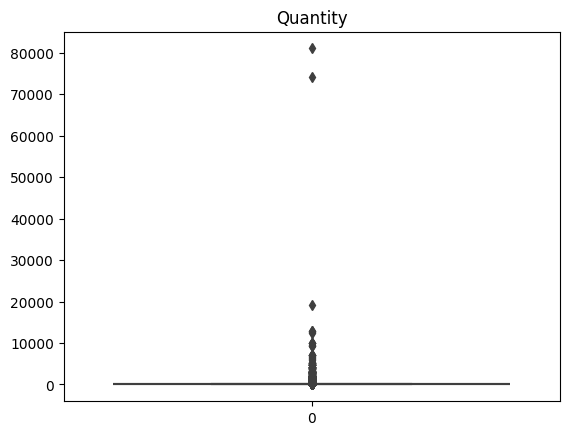

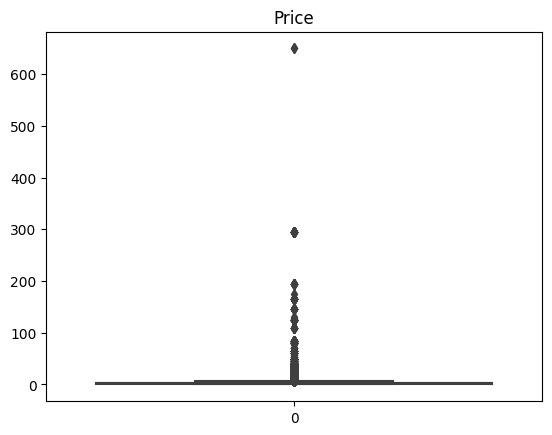

In [104]:
for i in df_order.select_dtypes(np.number).columns:
    sns.boxplot(df_order[i])
    plt.title(i)
    plt.show()

In [105]:
df_order[df_order['Price']>600]


,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,Sub_cat
748132,556444,22502,PICNIC BASKET WICKER 60 PIECES,60,2011-06-10 15:28:00,649.5,15098.0,United Kingdom,0
748143,556446,22502,PICNIC BASKET WICKER 60 PIECES,1,2011-06-10 15:33:00,649.5,15098.0,United Kingdom,0


In [106]:
df_order[df_order['StockCode']==22502]

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,Sub_cat
206913,509394,22502,PICNIC BASKET WICKER SMALL,4,2010-05-23 10:54:00,4.25,13647.0,United Kingdom,0
206936,509396,22502,PICNIC BASKET WICKER SMALL,16,2010-05-23 11:02:00,3.75,13330.0,United Kingdom,0
207042,509399,22502,PICNIC BASKET WICKER SMALL,4,2010-05-23 11:19:00,4.25,13019.0,United Kingdom,0
207059,509401,22502,PICNIC BASKET WICKER SMALL,4,2010-05-23 11:24:00,4.25,16702.0,United Kingdom,0
207145,509404,22502,PICNIC BASKET WICKER SMALL,16,2010-05-23 11:34:00,3.75,15251.0,United Kingdom,0
...,...,...,...,...,...,...,...,...,...
845229,564895,22502,PICNIC BASKET WICKER SMALL,1,2011-08-31 10:55:00,5.95,15596.0,United Kingdom,0
847032,565152,22502,PICNIC BASKET WICKER SMALL,2,2011-09-01 14:42:00,5.95,17799.0,United Kingdom,0
850833,565438,22502,PICNIC BASKET WICKER SMALL,2,2011-09-04 13:56:00,5.95,17229.0,United Kingdom,0
865609,566607,22502,PICNIC BASKET WICKER SMALL,2,2011-09-13 16:40:00,5.95,13032.0,United Kingdom,0


In [107]:
df_order['Description'].replace('PICNIC BASKET WICKER 60 PIECES','PICNIC BASKET WICKER SMALL',inplace=True)

In [108]:
df_order['Price'].replace(649.5,649.5/60,inplace=True)

In [109]:
## these outliers are valid outliers, there is a chance of ordering 80k and price can be 300 euros

Feature engineering

we have both order time and date in same column 'InvoiceDate'

we'll create a new colum for order time

In [110]:
df_order['order_time']=df_order['InvoiceDate'].str[11:]

In [111]:
df_order.head()

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,Sub_cat,order_time
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-12-01 07:45:00,6.95,13085.0,United Kingdom,0,07:45:00
1,489434,79323,PINK CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085.0,United Kingdom,1,07:45:00
2,489434,79323,WHITE CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085.0,United Kingdom,1,07:45:00
3,489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48,2009-12-01 07:45:00,2.10,13085.0,United Kingdom,0,07:45:00
4,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,2009-12-01 07:45:00,1.25,13085.0,United Kingdom,0,07:45:00


now we'll remove time from 'InvoiceDate'

In [112]:
df_order['InvoiceDate']=df_order['InvoiceDate'].str[:10]

In [113]:
df_order.head()

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,Sub_cat,order_time
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-12-01,6.95,13085.0,United Kingdom,0,07:45:00
1,489434,79323,PINK CHERRY LIGHTS,12,2009-12-01,6.75,13085.0,United Kingdom,1,07:45:00
2,489434,79323,WHITE CHERRY LIGHTS,12,2009-12-01,6.75,13085.0,United Kingdom,1,07:45:00
3,489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48,2009-12-01,2.10,13085.0,United Kingdom,0,07:45:00
4,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,2009-12-01,1.25,13085.0,United Kingdom,0,07:45:00


we'll filterput month and year from df_order['InvoiceDate']

In [114]:
df_order['InvoiceDate'] =pd.to_datetime(df_order['InvoiceDate'])

In [115]:
df_order['month'] = df_order['InvoiceDate'].dt.strftime('%B')

In [116]:
df_order['month'].unique()

array(['December', 'January', 'February', 'March', 'April', 'May', 'June',
       'July', 'August', 'September', 'October', 'November'], dtype=object)

In [117]:
df_order['year'] = df_order['InvoiceDate'].dt.strftime('%Y')

In [118]:
df_order.head(2)

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,Sub_cat,order_time,month,year
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-12-01,6.95,13085.0,United Kingdom,0,07:45:00,December,2009
1,489434,79323,PINK CHERRY LIGHTS,12,2009-12-01,6.75,13085.0,United Kingdom,1,07:45:00,December,2009


column day to see which week of the day the porchase was made

In [119]:
df_order['day'] = df_order['InvoiceDate'].dt.strftime('%A')

In [120]:
df_order.head(2)

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,Sub_cat,order_time,month,year,day
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-12-01,6.95,13085.0,United Kingdom,0,07:45:00,December,2009,Tuesday
1,489434,79323,PINK CHERRY LIGHTS,12,2009-12-01,6.75,13085.0,United Kingdom,1,07:45:00,December,2009,Tuesday


In [121]:
season = {
    'January': 'Winter',
    'February': 'Winter',
    'March': 'Spring',
    'April': 'Spring',
    'May': 'Spring',
    'June': 'Summer',
    'July': 'Summer',
    'August': 'Summer',
    'September': 'Autumn',
    'October': 'Autumn',
    'November': 'Autumn',
    'December': 'Winter'
}

In [122]:
df_order['seasons'] = df_order['month'].map(season)

In [123]:
df_order.head(2)

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,Sub_cat,order_time,month,year,day,seasons
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-12-01,6.95,13085.0,United Kingdom,0,07:45:00,December,2009,Tuesday,Winter
1,489434,79323,PINK CHERRY LIGHTS,12,2009-12-01,6.75,13085.0,United Kingdom,1,07:45:00,December,2009,Tuesday,Winter


In [124]:
df_order['day'].unique()

array(['Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday',
       'Monday'], dtype=object)

new column called weekend to see if the order was made on weekday or weekend

In [125]:
weekend={'Tuesday':'no', 'Wednesday':'no', 'Thursday':'no', 'Friday':'no', 'Saturday':'yes', 'Sunday':'yes',
       'Monday':'no'}

In [126]:
df_order['weekend'] = df_order['day'].map(weekend)

In [127]:
df_order.head(2)

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,Sub_cat,order_time,month,year,day,seasons,weekend
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-12-01,6.95,13085.0,United Kingdom,0,07:45:00,December,2009,Tuesday,Winter,no
1,489434,79323,PINK CHERRY LIGHTS,12,2009-12-01,6.75,13085.0,United Kingdom,1,07:45:00,December,2009,Tuesday,Winter,no


bucketting order time  into a categorical column

In [128]:
df_order['order_time'] = pd.to_datetime(df_order['order_time'])

df_order['year'] = df_order['InvoiceDate'].dt.strftime('%Y')

In [129]:
df_order['order_time'] =df_order['order_time'].dt.strftime('%H:%M:%S')

In [130]:
df_order.head(2)

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,Sub_cat,order_time,month,year,day,seasons,weekend
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-12-01,6.95,13085.0,United Kingdom,0,07:45:00,December,2009,Tuesday,Winter,no
1,489434,79323,PINK CHERRY LIGHTS,12,2009-12-01,6.75,13085.0,United Kingdom,1,07:45:00,December,2009,Tuesday,Winter,no


df_.info()

In [131]:
df_order['Hour']=pd.to_datetime(df_order['order_time']).dt.hour

In [132]:
def classify_time(hour):
    if 6 <= hour < 12:
        return 'Morning'
    elif 12 <= hour < 18:
        return 'Afternoon'
    else:
        return 'Evening'

In [133]:
df_order['Hour'] = df_order['Hour'].apply(classify_time)

In [134]:
df_order

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,Sub_cat,order_time,month,year,day,seasons,weekend,Hour
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-12-01,6.95,13085.0,United Kingdom,0,07:45:00,December,2009,Tuesday,Winter,no,Morning
1,489434,79323,PINK CHERRY LIGHTS,12,2009-12-01,6.75,13085.0,United Kingdom,1,07:45:00,December,2009,Tuesday,Winter,no,Morning
2,489434,79323,WHITE CHERRY LIGHTS,12,2009-12-01,6.75,13085.0,United Kingdom,1,07:45:00,December,2009,Tuesday,Winter,no,Morning
3,489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48,2009-12-01,2.10,13085.0,United Kingdom,0,07:45:00,December,2009,Tuesday,Winter,no,Morning
4,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,2009-12-01,1.25,13085.0,United Kingdom,0,07:45:00,December,2009,Tuesday,Winter,no,Morning
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1067365,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09,0.85,12680.0,France,0,12:50:00,December,2011,Friday,Winter,no,Afternoon
1067366,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09,2.10,12680.0,France,0,12:50:00,December,2011,Friday,Winter,no,Afternoon
1067367,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09,4.15,12680.0,France,0,12:50:00,December,2011,Friday,Winter,no,Afternoon
1067368,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09,4.15,12680.0,France,0,12:50:00,December,2011,Friday,Winter,no,Afternoon


column Total amount to tell the total amount by the product in that perticular invoice

In [135]:
df_order['total_amount']=df_order['Price']*df_order['Quantity']

In [136]:
df_order.shape

(802632, 17)

In [137]:
df_order.info()

<class 'pandas.core.frame.DataFrame'>
Index: 802632 entries, 0 to 1067369
Data columns (total 17 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   Invoice       802632 non-null  object        
 1   StockCode     802632 non-null  object        
 2   Description   802632 non-null  object        
 3   Quantity      802632 non-null  int64         
 4   InvoiceDate   802632 non-null  datetime64[ns]
 5   Price         802632 non-null  float64       
 6   Customer ID   802632 non-null  object        
 7   Country       802632 non-null  object        
 8   Sub_cat       802632 non-null  object        
 9   order_time    802632 non-null  object        
 10  month         802632 non-null  object        
 11  year          802632 non-null  object        
 12  day           802632 non-null  object        
 13  seasons       802632 non-null  object        
 14  weekend       802632 non-null  object        
 15  Hour          802632 

changing columns Invoice,StockCode,Customer ID,Sub_cat into object because they are categorical values

In [138]:
df_order['Customer ID']=df_order['Customer ID'].astype(int)

In [139]:
cols=['Invoice','StockCode','Customer ID','Sub_cat']

In [140]:
for i in cols:
    df_order[i]=df_order[i].astype(object)

In [141]:
df_order.info()

<class 'pandas.core.frame.DataFrame'>
Index: 802632 entries, 0 to 1067369
Data columns (total 17 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   Invoice       802632 non-null  object        
 1   StockCode     802632 non-null  object        
 2   Description   802632 non-null  object        
 3   Quantity      802632 non-null  int64         
 4   InvoiceDate   802632 non-null  datetime64[ns]
 5   Price         802632 non-null  float64       
 6   Customer ID   802632 non-null  object        
 7   Country       802632 non-null  object        
 8   Sub_cat       802632 non-null  object        
 9   order_time    802632 non-null  object        
 10  month         802632 non-null  object        
 11  year          802632 non-null  object        
 12  day           802632 non-null  object        
 13  seasons       802632 non-null  object        
 14  weekend       802632 non-null  object        
 15  Hour          802632 

After  feature engineering and  now we are with 802632 rows and 17 columns

In [142]:
df_order.head(2)

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,Sub_cat,order_time,month,year,day,seasons,weekend,Hour,total_amount
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-12-01,6.95,13085,United Kingdom,0,07:45:00,December,2009,Tuesday,Winter,no,Morning,83.4
1,489434,79323,PINK CHERRY LIGHTS,12,2009-12-01,6.75,13085,United Kingdom,1,07:45:00,December,2009,Tuesday,Winter,no,Morning,81.0


# Analysis

Total number of unique products available

In [143]:
df_order["StockCode"].nunique()

3863

In [144]:
df_order.describe().T

,count,mean,min,25%,50%,75%,max,std
Quantity,802632.0,13.319211,1.0,2.0,5.0,12.0,80995.0,143.868968
InvoiceDate,802632,2011-01-01 20:07:06.492838912,2009-12-01 00:00:00,2010-07-07 00:00:00,2010-12-03 00:00:00,2011-07-28 00:00:00,2011-12-09 00:00:00,NaN
Price,802632.0,2.929171,0.03,1.25,1.95,3.75,295.0,4.152337
total_amount,802632.0,21.673059,0.06,4.95,11.8,19.5,168469.6,218.284198


In [145]:
df_order.describe(include=object).T

,count,unique,top,freq
Invoice,802632,36594,576339,541
StockCode,802632,3863,85099,6406
Description,802632,5269,WHITE HANGING HEART T-LIGHT HOLDER,5181
Customer ID,802632,5852,17841,12879
Country,802632,41,United Kingdom,724440
Sub_cat,802632,2,0,713989
order_time,802632,775,12:36:00,3418
month,802632,12,November,124425
year,802632,3,2010,401661
day,802632,7,Thursday,161056


Top 10 products

In [146]:
top_10_prod=df_order['Description'].value_counts().sort_values(ascending=False).head(10)
top_10_prod

Description
WHITE HANGING HEART T-LIGHT HOLDER    5181
REGENCY CAKESTAND 3 TIER              3428
ASSORTED COLOUR BIRD ORNAMENT         2777
JUMBO BAG RED RETROSPOT               2702
REX CASH+CARRY JUMBO SHOPPER          2141
PARTY BUNTING                         2121
LUNCH BAG  BLACK SKULL.               2117
LUNCH BAG SPACEBOY DESIGN             1941
HOME BUILDING BLOCK WORD              1929
STRAWBERRY CERAMIC TRINKET BOX        1922
Name: count, dtype: int64

In [147]:
x=px.bar(x=(top_10_prod.index),y=top_10_prod.values,color=top_10_prod.index)

x.update_layout(
    xaxis_title="Product",
    yaxis_title="Count",
    title='Top 10 Products'
)

TOP -10 PRODUCTS ARE

WHITE HANGING HEART T-LIGHT HOLDER  -  5181

REGENCY CAKESTAND 3 TIER            -  3428

ASSORTED COLOUR BIRD ORNAMENT       -  2777

JUMBO BAG RED RETROSPOT             -  2702

REX CASH+CARRY JUMBO SHOPPER        -  2141

PARTY BUNTING                       -  2121

LUNCH BAG  BLACK SKULL.             -  2117

LUNCH BAG SPACEBOY DESIGN           -  1941

HOME BUILDING BLOCK WORD            -  1929

STRAWBERRY CERAMIC TRINKET BOX      -  1922

Top 10 countries with highest sales

In [148]:
top_10_coun=df_order['Country'].value_counts().sort_values(ascending=False).head(10)
top_10_coun

Country
United Kingdom    724440
Germany            16034
EIRE               15524
France             13322
Netherlands         4983
Spain               3617
Switzerland         2956
Belgium             2923
Portugal            2381
Australia           1806
Name: count, dtype: int64

In [150]:
x=px.bar(x=top_10_coun.index,y=top_10_coun.values,color=top_10_coun.index)

x.update_layout(
    xaxis_title="Product",
    yaxis_title="Count",
    title='Top 10 countries'
)

TOP - 10 COUNTRIES

United Kingdom -   724440

Germany         -   16034

EIRE             -  15524

France           -  13322

Netherlands     -    4983

Spain          -     3617

Switzerland    -     2956

Belgium         -    2923

Portugal        -   2381

Australia        -   1806

here we can see that most of the major sales happned in United Kingdom

Top 5 products and the quantity sold

In [145]:
df_order.groupby('Description').agg({'Quantity':'sum'}).sort_values(by='Quantity',ascending=False).head()

,Quantity
Description,
WORLD WAR 2 GLIDERS ASSTD DESIGNS,109169
WHITE HANGING HEART T-LIGHT HOLDER,93640
"PAPER CRAFT , LITTLE BIRDIE",80995
ASSORTED COLOUR BIRD ORNAMENT,79913
MEDIUM CERAMIC TOP STORAGE JAR,77916


total unique invoice available

In [146]:
df_order['Invoice'].unique()

array([489434, 489435, 489436, ..., 581585, 581586, 581587], dtype=object)

Top 5 invoice and its toatal amount

In [147]:
df_order.groupby('Invoice').agg({'total_amount':'sum'}).sort_values(by='total_amount',ascending=False).head()

,total_amount
Invoice,
581483,168469.60
541431,77183.60
493819,44051.60
524181,33167.80
537659,31770.98


Month wise sales

In [148]:
month= df_order.groupby('month').agg({'total_amount':'sum'}).reset_index().sort_values(by='total_amount')
month

,month,total_amount
3,February,943095.700
0,April,1043020.680
4,January,1099256.010
5,July,1176120.430
1,August,1233386.460
6,June,1246978.235
7,March,1253140.040
8,May,1255368.440
11,September,1749045.870
10,October,2020767.640


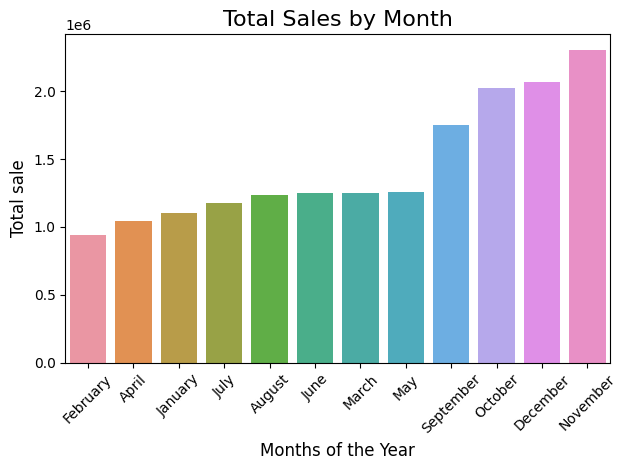

In [149]:
sns.barplot(x=month['month'],y=month['total_amount'])
plt.title('Total Sales by Month', fontsize=16)
plt.xlabel('Months of the Year', fontsize=12)
plt.ylabel('Total sale', fontsize=12)
plt.xticks(rotation=45,  fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()

we can see that november , december, october are the top 3 months with the highest sales

and Feburary with the least amount of sales

seasonal sales

In [150]:
season= df_order.groupby('seasons').agg({'total_amount':'sum'}).reset_index().sort_values(by='total_amount')
season

,seasons,total_amount
1,Spring,3551529.160
2,Summer,3656485.125
3,Winter,4113662.830
0,Autumn,6073813.690


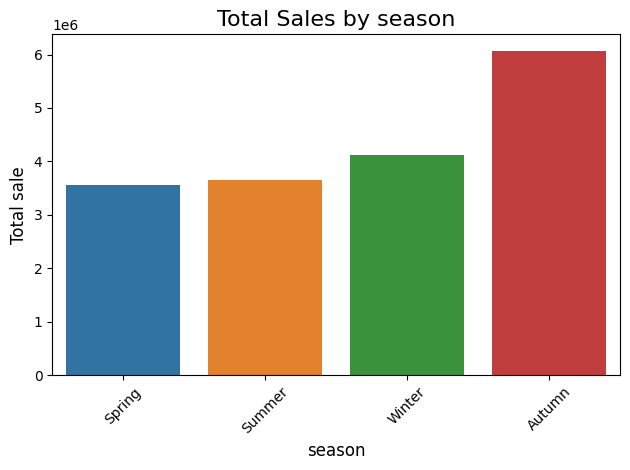

In [151]:
sns.barplot(x=season['seasons'],y=season['total_amount'])
plt.title('Total Sales by season', fontsize=16)
plt.xlabel('season', fontsize=12)
plt.ylabel('Total sale', fontsize=12)
plt.xticks(rotation=45,  fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()

SEASON AUTOMN HAS THE HIGHEST SALE

SPING AND SUMMER HAS ALMOST SAME AMOUNT OF SALES WITH LEAST VALUE

Day wise sales

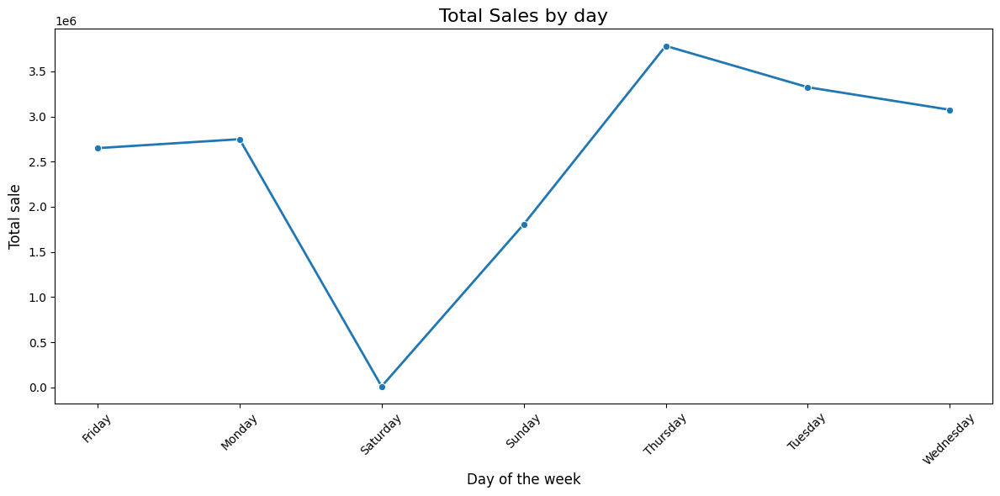

In [152]:
day = df_order.groupby('day').agg({'total_amount': 'sum'}).reset_index()
plt.figure(figsize=(12, 6))
sns.lineplot(data=day, x='day', y='total_amount', marker='o', linewidth=2)
plt.title('Total Sales by day', fontsize=16)
plt.xlabel('Day of the week', fontsize=12)
plt.ylabel('Total sale', fontsize=12)
plt.xticks(rotation=45,  fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()

highest amount of sales were made on thursday and least on saturdat

Busiest hour in the day

In [153]:
Hour = df_order.groupby('Hour').agg({'total_amount': 'sum'}).reset_index()
Hour

,Hour,total_amount
0,Afternoon,1.040824e+07
1,Evening,3.587792e+05
2,Morning,6.628471e+06


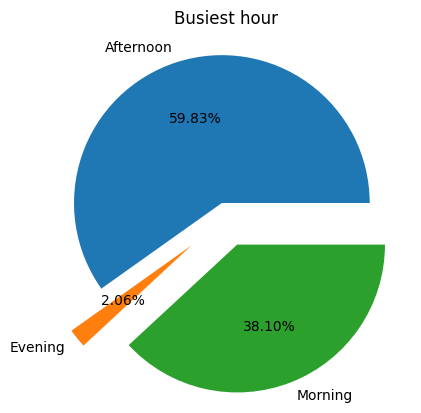

In [154]:
plt.pie(x=Hour['total_amount'],labels=Hour['Hour'],explode=[0.1,0.3,0.2],autopct='%1.2f%%')
plt.title('Busiest hour')
plt.show()

In [155]:
df_order.columns

Index(['Invoice', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'Price', 'Customer ID', 'Country', 'Sub_cat', 'order_time', 'month',
       'year', 'day', 'seasons', 'weekend', 'Hour', 'total_amount'],
      dtype='object')

afternoon is the most busiest hour wit more than 59% of business happening
and evening is the dullest hour of the day

sales by type of the day

In [156]:
weekend=df_order.groupby('weekend')['Invoice'].count().to_frame().reset_index()
weekend

,weekend,Invoice
0,no,666181
1,yes,136451


Text(0.5, 1.0, 'number of invoise by type of the day')

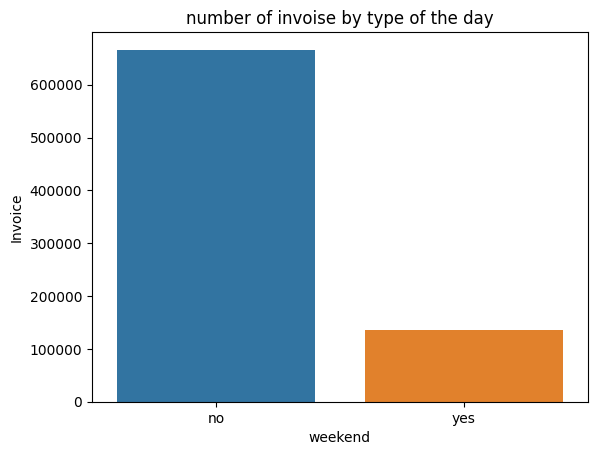

In [157]:
sns.barplot(y=weekend['Invoice'],x=weekend['weekend'])
plt.title('number of invoise by type of the day')

Majority of the invoices are made on week days

sales by hourly basis on type of day

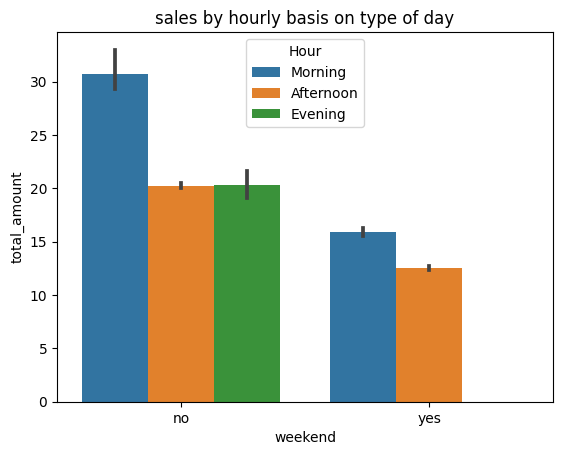

In [151]:
sns.barplot(x=df_order['weekend'],y=df_order['total_amount'],hue=df_order['Hour'])
plt.title('sales by hourly basis on type of day')
plt.show()

There are no evening sales in the weekend , which means the business is closed for weekend evenings

### RFM (Recency, Frequency, Monetary) Analysis

- RECENCY (R): Time since last purchase
- FREQUENCY (F): Total number of purchases
- MONETARY VALUE (M): Total monetary value

calculating Recency

In [152]:
df_order.head(2)

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,Sub_cat,order_time,month,year,day,seasons,weekend,Hour,total_amount
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-12-01,6.95,13085,United Kingdom,0,07:45:00,December,2009,Tuesday,Winter,no,Morning,83.4
1,489434,79323,PINK CHERRY LIGHTS,12,2009-12-01,6.75,13085,United Kingdom,1,07:45:00,December,2009,Tuesday,Winter,no,Morning,81.0


In [153]:
oldest_date = min(df_order['InvoiceDate'])
oldest_date

Timestamp('2009-12-01 00:00:00')

In [154]:
latest_date = max(df_order['InvoiceDate'])
latest_date

Timestamp('2011-12-09 00:00:00')

In [155]:
df_order['last_purchase_date'] = df_order.groupby('Customer ID')['InvoiceDate'].transform(max)

In [156]:
df_order.head()

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,Sub_cat,order_time,month,year,day,seasons,weekend,Hour,total_amount,last_purchase_date
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-12-01,6.95,13085,United Kingdom,0,07:45:00,December,2009,Tuesday,Winter,no,Morning,83.4,2011-07-05
1,489434,79323,PINK CHERRY LIGHTS,12,2009-12-01,6.75,13085,United Kingdom,1,07:45:00,December,2009,Tuesday,Winter,no,Morning,81.0,2011-07-05
2,489434,79323,WHITE CHERRY LIGHTS,12,2009-12-01,6.75,13085,United Kingdom,1,07:45:00,December,2009,Tuesday,Winter,no,Morning,81.0,2011-07-05
3,489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48,2009-12-01,2.10,13085,United Kingdom,0,07:45:00,December,2009,Tuesday,Winter,no,Morning,100.8,2011-07-05
4,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,2009-12-01,1.25,13085,United Kingdom,0,07:45:00,December,2009,Tuesday,Winter,no,Morning,30.0,2011-07-05


In [157]:
# now we have the latest purchase date for each customer

In [158]:
df_order.info()

<class 'pandas.core.frame.DataFrame'>
Index: 802632 entries, 0 to 1067369
Data columns (total 18 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   Invoice             802632 non-null  object        
 1   StockCode           802632 non-null  object        
 2   Description         802632 non-null  object        
 3   Quantity            802632 non-null  int64         
 4   InvoiceDate         802632 non-null  datetime64[ns]
 5   Price               802632 non-null  float64       
 6   Customer ID         802632 non-null  object        
 7   Country             802632 non-null  object        
 8   Sub_cat             802632 non-null  object        
 9   order_time          802632 non-null  object        
 10  month               802632 non-null  object        
 11  year                802632 non-null  object        
 12  day                 802632 non-null  object        
 13  seasons             802632 non-nu

In [159]:
# calculating the days since last purchase date for each customers taking last billed invoice date as reference

In [160]:
df_order["customer_recency"] = latest_date - df_order["last_purchase_date"]

In [161]:
df_order.head()

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,Sub_cat,order_time,month,year,day,seasons,weekend,Hour,total_amount,last_purchase_date,customer_recency
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-12-01,6.95,13085,United Kingdom,0,07:45:00,December,2009,Tuesday,Winter,no,Morning,83.4,2011-07-05,157 days
1,489434,79323,PINK CHERRY LIGHTS,12,2009-12-01,6.75,13085,United Kingdom,1,07:45:00,December,2009,Tuesday,Winter,no,Morning,81.0,2011-07-05,157 days
2,489434,79323,WHITE CHERRY LIGHTS,12,2009-12-01,6.75,13085,United Kingdom,1,07:45:00,December,2009,Tuesday,Winter,no,Morning,81.0,2011-07-05,157 days
3,489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48,2009-12-01,2.10,13085,United Kingdom,0,07:45:00,December,2009,Tuesday,Winter,no,Morning,100.8,2011-07-05,157 days
4,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,2009-12-01,1.25,13085,United Kingdom,0,07:45:00,December,2009,Tuesday,Winter,no,Morning,30.0,2011-07-05,157 days


In [162]:
df_order[["Customer ID", 'last_purchase_date', "customer_recency"]]

,Customer ID,last_purchase_date,customer_recency
0,13085,2011-07-05,157 days
1,13085,2011-07-05,157 days
2,13085,2011-07-05,157 days
3,13085,2011-07-05,157 days
4,13085,2011-07-05,157 days
...,...,...,...
1067365,12680,2011-12-09,0 days
1067366,12680,2011-12-09,0 days
1067367,12680,2011-12-09,0 days
1067368,12680,2011-12-09,0 days


In [163]:
df_order['recency'] = pd.to_numeric(df_order['customer_recency'].dt.days.astype('int64'))

In [164]:
customer_recency = df_order.groupby('Customer ID', as_index=False)['recency'].mean()

In [165]:
customer_recency.sort_values(by='recency', ascending=False).head()

,Customer ID,recency
2270,14654,738.0
5164,17592,738.0
1156,13526,738.0
4636,17056,738.0
4667,17087,737.0


In [166]:
# we already have recency we can drop last_purchase_date
df_order.drop(columns='last_purchase_date',inplace=True)

recency distribution

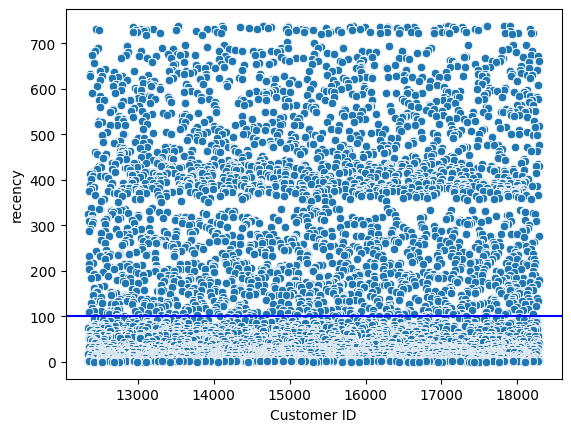

In [167]:
sns.scatterplot(data=df_order, x="Customer ID", y="recency")
plt.axhline(100, color="blue")

In [168]:
px.histogram(df_order, x="recency", nbins=70)

frequency calculation

In [169]:
customer_frequency = df_order.groupby('Customer ID', as_index=False)['Invoice'].nunique()
customer_frequency.rename(columns={'Invoice':'Frequency'}, inplace=True)
customer_frequency.sort_values(by='Frequency', ascending=False)


,Customer ID,Frequency
2520,14911,373
393,12748,322
5408,17841,211
2916,15311,207
730,13089,203
...,...,...
4528,16944,1
2841,15236,1
421,12776,1
4525,16941,1


In [170]:
px.scatter(customer_frequency, x="Customer ID", y="Frequency")

In [171]:
px.histogram(customer_frequency, x="Customer ID", y="Frequency", nbins=1000)

Calculating Monetary

In [172]:
customer_monetary = df_order.groupby('Customer ID', as_index=False)['total_amount'].sum()
customer_monetary.rename(columns={'total_amount':'Monetary'}, inplace=True)
customer_monetary.sort_values(by='Monetary', ascending=False).head()

,Customer ID,Monetary
5666,18102,608821.65
2262,14646,526751.52
1778,14156,303578.63
2520,14911,276654.61
5026,17450,246973.09


In [173]:
df_order.columns

Index(['Invoice', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'Price', 'Customer ID', 'Country', 'Sub_cat', 'order_time', 'month',
       'year', 'day', 'seasons', 'weekend', 'Hour', 'total_amount',
       'customer_recency', 'recency'],
      dtype='object')

Monetary distribution

In [174]:
px.scatter(customer_monetary, x="Customer ID", y="Monetary")

In [175]:
px.histogram(customer_monetary, x="Monetary", nbins=50)

RFM table creation

In [176]:
customer_rfm = pd.merge(pd.merge(customer_recency, customer_frequency, on='Customer ID'), customer_monetary, on='Customer ID')
customer_rfm.head()

,Customer ID,recency,Frequency,Monetary
0,12346,325.0,3,77352.96
1,12347,2.0,8,5633.32
2,12348,75.0,5,1658.40
3,12349,18.0,3,3678.69
4,12350,310.0,1,294.40


Segmentation of customers using RFM scores

Calculating RFM scores

In [177]:
customer_rfm1=customer_rfm.copy()

In [179]:
customer_rfm1.head()

,Customer ID,recency,Frequency,Monetary
0,12346,325.0,3,77352.96
1,12347,2.0,8,5633.32
2,12348,75.0,5,1658.40
3,12349,18.0,3,3678.69
4,12350,310.0,1,294.40


This scoring is based on categorising R, F, M values in 4 buckets, basically deviding the values into quaters

- 4 is given to the top value and 1 for least value

In [180]:
customer_rfm1.describe().T

,count,mean,std,min,25%,50%,75%,max
recency,5852.0,199.732399,208.523287,0.00,25.000,95.000,379.0000,738.00
Frequency,5852.0,6.253247,12.749286,1.00,1.000,3.000,7.0000,373.00
Monetary,5852.0,2972.571908,14597.005578,2.95,344.975,880.375,2288.7725,608821.65


In [181]:
quantiles = customer_rfm1.quantile(q = [0.25, 0.50, 0.75])
quantiles

,Customer ID,recency,Frequency,Monetary
0.25,13837.75,25.0,1.0,344.9750
0.50,15320.5,95.0,3.0,880.3750
0.75,16802.25,379.0,7.0,2288.7725


Recency score

In [182]:
def r_score(rfm):
    if rfm.recency <= 25.0:
        recency_score = 4
    elif rfm.recency <= 95.0:
        recency_score = 3
    elif rfm.recency <= 379.0:
        recency_score = 2
    else:
        recency_score = 1
    return recency_score

customer_rfm1['Recency_Score'] = customer_rfm1.apply(r_score, axis=1)
customer_rfm1.head()

,Customer ID,recency,Frequency,Monetary,Recency_Score
0,12346,325.0,3,77352.96,2
1,12347,2.0,8,5633.32,4
2,12348,75.0,5,1658.40,3
3,12349,18.0,3,3678.69,4
4,12350,310.0,1,294.40,2


In [183]:
customer_rfm1['Recency_Score'].value_counts()

Recency_Score
4    1487
2    1466
3    1454
1    1445
Name: count, dtype: int64

Frequency score

In [184]:
def f_score(rfm):
    if rfm.Frequency >= 10.0:
        frequency_score = 4
    elif rfm.Frequency >= 5.0:
        frequency_score = 3
    elif rfm.Frequency >= 2.0:
        frequency_score = 2
    else:
        frequency_score = 1
    return frequency_score

customer_rfm1['Frequency_Score'] = customer_rfm1.apply(f_score, axis=1)
customer_rfm1.head()

,Customer ID,recency,Frequency,Monetary,Recency_Score,Frequency_Score
0,12346,325.0,3,77352.96,2,2
1,12347,2.0,8,5633.32,4,3
2,12348,75.0,5,1658.40,3,3
3,12349,18.0,3,3678.69,4,2
4,12350,310.0,1,294.40,2,1


In [185]:
customer_rfm1['Frequency_Score'].value_counts()

Frequency_Score
2    2093
1    1618
3    1180
4     961
Name: count, dtype: int64

Monetary score

In [186]:
def m_score(rfm):
    if rfm.Monetary >= 2288.7725:
        monetary_score = 4
    elif rfm.Monetary >= 880.3750:
        monetary_score = 3
    elif rfm.Monetary >= 344.9750:
        monetary_score = 2
    else:
        monetary_score = 1
    return monetary_score

customer_rfm1['Monetary_Score'] = customer_rfm1.apply(m_score, axis=1)
customer_rfm1.head()

,Customer ID,recency,Frequency,Monetary,Recency_Score,Frequency_Score,Monetary_Score
0,12346,325.0,3,77352.96,2,2,4
1,12347,2.0,8,5633.32,4,3,4
2,12348,75.0,5,1658.40,3,3,3
3,12349,18.0,3,3678.69,4,2,4
4,12350,310.0,1,294.40,2,1,1


Now we'll calculate the RFM score by combaining RFM values, this is not just by adding RFM values inestad we'll concate those values

In [187]:
def rfm_score(rfm):
    return str(int(rfm['Recency_Score'])) + str(int(rfm['Frequency_Score'])) + str(int(rfm['Monetary_Score']))


customer_rfm1['RFM_Score'] = customer_rfm1.apply(rfm_score, axis=1)
customer_rfm1.head()

,Customer ID,recency,Frequency,Monetary,Recency_Score,Frequency_Score,Monetary_Score,RFM_Score
0,12346,325.0,3,77352.96,2,2,4,224
1,12347,2.0,8,5633.32,4,3,4,434
2,12348,75.0,5,1658.40,3,3,3,333
3,12349,18.0,3,3678.69,4,2,4,424
4,12350,310.0,1,294.40,2,1,1,211


Distribution of RFM score

In [188]:
px.histogram(customer_rfm, x = customer_rfm1['RFM_Score'].value_counts().index, 
                   y = customer_rfm1['RFM_Score'].value_counts().values, 
                   title = 'Customer RFM Score Distribution',
                   labels = dict(x = "Customer_RFM_Score", y ="counts"))

Now we'll segment the customer based on RFM score into 9 seegments

In [189]:
segments = {'Customer_Segment':['Star Customer', 
                                'Top Loyal Customer', 
                                'Loyal Customer', 
                                'Top Recent Customer', 
                                'Recent Customer', 
                                'Top Customer Needed Attention', 
                                'Customer Needed Attention', 
                                'Top Lost Customer', 
                                'Lost Customer'],
            'RFM':['(2|3|4)-(4)-(4)', 
                   '(3)-(1|2|3|4)-(3|4)', 
                   '(3)-(1|2|3|4)-(1|2)', 
                   '(4)-(1|2|3|4)-(3|4)', 
                   '(4)-(1|2|3|4)-(1|2)',
                   '(2|3)-(1|2|3|4)-(3|4)', 
                   '(2|3)-(1|2|3|4)-(1|2)',
                   '(1)-(1|2|3|4)-(3|4)', 
                   '(1)-(1|2|3|4)-(1|2)',]}

pd.DataFrame(segments)

,Customer_Segment,RFM
0,Star Customer,(2|3|4)-(4)-(4)
1,Top Loyal Customer,(3)-(1|2|3|4)-(3|4)
2,Loyal Customer,(3)-(1|2|3|4)-(1|2)
3,Top Recent Customer,(4)-(1|2|3|4)-(3|4)
4,Recent Customer,(4)-(1|2|3|4)-(1|2)
5,Top Customer Needed Attention,(2|3)-(1|2|3|4)-(3|4)
6,Customer Needed Attention,(2|3)-(1|2|3|4)-(1|2)
7,Top Lost Customer,(1)-(1|2|3|4)-(3|4)
8,Lost Customer,(1)-(1|2|3|4)-(1|2)


In [190]:
def segment(rfm):
    
    if (rfm[0] in ['2', '3', '4']) & (rfm[1] in ['4']) & (rfm[2] in ['4']):
        rfm = 'Star Customer'
        
    elif (rfm[0] in ['3']) & (rfm[1] in ['1', '2', '3', '4']) & (rfm[2] in ['3', '4']):
        rfm = 'Top Loyal Customer'
        
    elif (rfm[0] in ['3']) & (rfm[1] in ['1', '2', '3', '4']) & (rfm[2] in ['1', '2']):
        rfm = 'Loyal Customer'
    
    elif (rfm[0] in ['4']) & (rfm[1] in ['1', '2', '3', '4']) & (rfm[2] in ['3', '4']):
        rfm = 'Top Recent Customer'
    
    elif (rfm[0] in ['4']) & (rfm[1] in ['1', '2', '3', '4']) & (rfm[2] in ['1', '2']):
        rfm = 'Recent Customer'
    
    elif (rfm[0] in ['2', '3']) & (rfm[1] in ['1', '2', '3', '4']) & (rfm[2] in ['3', '4']):
        rfm = 'Top Customer Needed Attention'    
   
    elif (rfm[0] in ['2', '3']) & (rfm[1] in ['1', '2', '3', '4']) & (rfm[2] in ['1', '2']):
        rfm = 'Customer Needed Attention'
    
    elif (rfm[0] in ['1']) & (rfm[1] in ['1', '2', '3', '4']) & (rfm[2] in ['3', '4']):
        rfm = 'Top Lost Customer'
                
    elif (rfm[0] in ['1']) & (rfm[1] in ['1', '2', '3', '4']) & (rfm[2] in ['1', '2']):
        rfm = 'Lost Customer'
    
    return rfm 

In [191]:
customer_rfm1['Segment'] = customer_rfm1["RFM_Score"].apply(segment)
customer_rfm1

,Customer ID,recency,Frequency,Monetary,Recency_Score,Frequency_Score,Monetary_Score,RFM_Score,Segment
0,12346,325.0,3,77352.96,2,2,4,224,Top Customer Needed Attention
1,12347,2.0,8,5633.32,4,3,4,434,Top Recent Customer
2,12348,75.0,5,1658.40,3,3,3,333,Top Loyal Customer
3,12349,18.0,3,3678.69,4,2,4,424,Top Recent Customer
4,12350,310.0,1,294.40,2,1,1,211,Customer Needed Attention
...,...,...,...,...,...,...,...,...,...
5847,18283,3.0,22,2730.70,4,4,4,444,Star Customer
5848,18284,431.0,1,411.68,1,1,2,112,Lost Customer
5849,18285,660.0,1,377.00,1,1,2,112,Lost Customer
5850,18286,476.0,2,1246.43,1,2,3,123,Top Lost Customer


spread of segments

In [197]:
fig = px.pie( values = customer_rfm1['Segment'].value_counts(), 
             names = (customer_rfm1['Segment'].value_counts()).index, 
             title = 'Predicted Clusters Distribution')
fig.show()

<Axes: ylabel='count'>

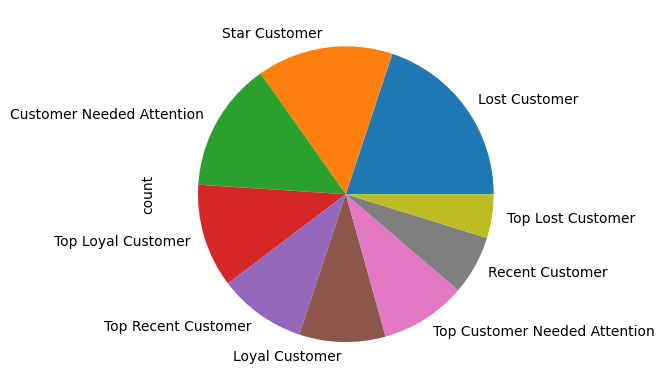

In [200]:
customer_rfm1['Segment'].value_counts().plot(kind='pie')

In [202]:
px.histogram(customer_rfm, 
                   x = customer_rfm1['Segment'].value_counts().index, 
                   y = customer_rfm1['Segment'].value_counts().values, 
                   title = 'Customer Segment Distribution',
                   labels = dict(x = "Segment", y ="counts"))

In [203]:
df_customer_segmentation =pd.DataFrame(customer_rfm1['Segment'].value_counts())
df_customer_segmentation

,count
Segment,
Lost Customer,1165
Star Customer,871
Customer Needed Attention,830
Top Loyal Customer,664
Top Recent Customer,561
Loyal Customer,552
Top Customer Needed Attention,550
Recent Customer,379
Top Lost Customer,280


In [204]:
x=px.treemap(df_customer_segmentation, 
                 path=[df_customer_segmentation.index], 
                 values='count', 
                 width=950, height=600)
x.update_layout(title_text='Customer Segmentation',
                  title_x=0.5, title_font=dict(size=20)
                  )
x.update_layout(margin = dict(t=50, l=25, r=25, b=25))


In [205]:
customer_rfm1

,Customer ID,recency,Frequency,Monetary,Recency_Score,Frequency_Score,Monetary_Score,RFM_Score,Segment
0,12346,325.0,3,77352.96,2,2,4,224,Top Customer Needed Attention
1,12347,2.0,8,5633.32,4,3,4,434,Top Recent Customer
2,12348,75.0,5,1658.40,3,3,3,333,Top Loyal Customer
3,12349,18.0,3,3678.69,4,2,4,424,Top Recent Customer
4,12350,310.0,1,294.40,2,1,1,211,Customer Needed Attention
...,...,...,...,...,...,...,...,...,...
5847,18283,3.0,22,2730.70,4,4,4,444,Star Customer
5848,18284,431.0,1,411.68,1,1,2,112,Lost Customer
5849,18285,660.0,1,377.00,1,1,2,112,Lost Customer
5850,18286,476.0,2,1246.43,1,2,3,123,Top Lost Customer


K-means Clustering

In [206]:
customer_rfm.corr()

,Customer ID,recency,Frequency,Monetary
Customer ID,1.000000,0.023182,-0.002791,-0.006969
recency,0.023182,1.000000,-0.258582,-0.124497
Frequency,-0.002791,-0.258582,1.000000,0.621731
Monetary,-0.006969,-0.124497,0.621731,1.000000


<Axes: >

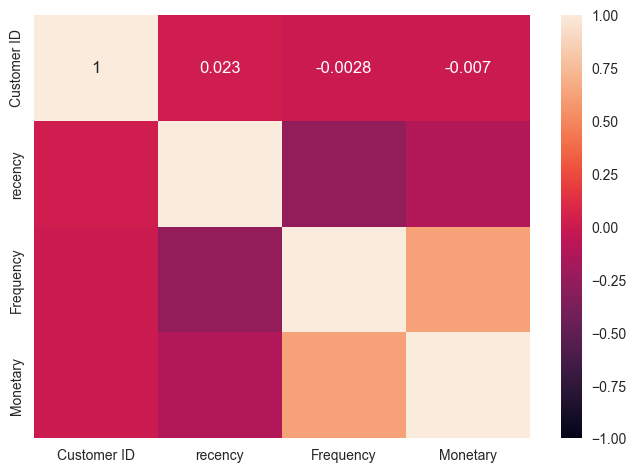

In [207]:
sns.heatmap(customer_rfm.corr(),vmin=-1,annot=True)
# there is no multicolinearity

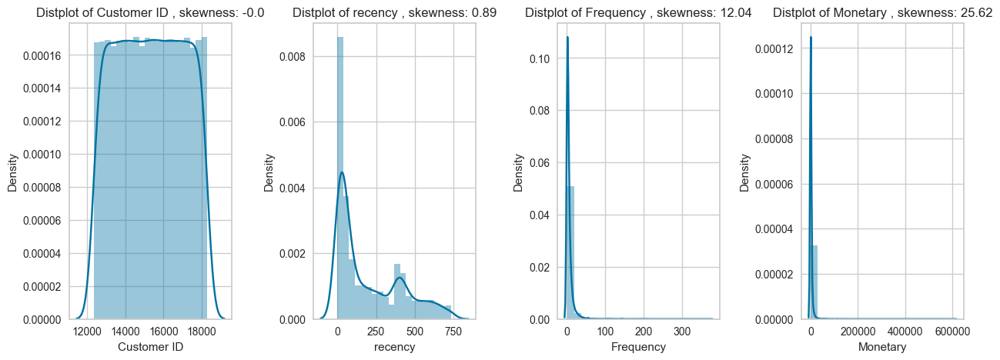

In [208]:
plt.figure(1 , figsize = (15 , 5))
n = 1
for i in customer_rfm.columns:
    plt.subplot(1 , 4 , n)
    plt.subplots_adjust( wspace = 0.5)
    sns.distplot(customer_rfm[i] , bins = 20)
    plt.title('Distplot of {} , skewness: {}'.format(i,round(customer_rfm[i].skew(),2)))
    n += 1
plt.show()

using power transform

In [209]:
from sklearn.preprocessing import PowerTransformer, StandardScaler

In [210]:
pt = PowerTransformer(method='yeo-johnson')
trans= pt.fit_transform(customer_rfm)
rfm_trans = pd.DataFrame(trans, columns =customer_rfm.columns )

print(rfm_trans.skew())

Customer ID   -0.034153
recency       -0.120408
Frequency      0.164823
Monetary      -0.008152
dtype: float64


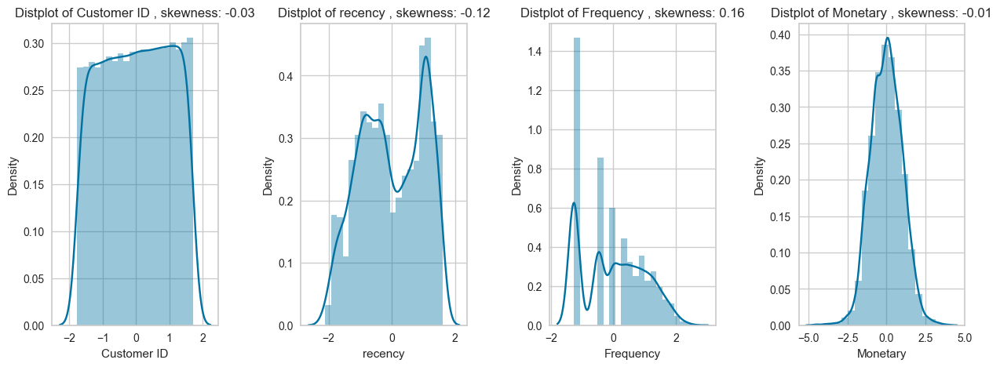

In [218]:
plt.figure(1 , figsize = (15 , 5))
n = 1
for i in rfm_trans.columns:
    plt.subplot(1 , 4 , n)
    plt.subplots_adjust( wspace = 0.5)
    sns.distplot(rfm_trans[i] , bins = 20)
    plt.title('Distplot of {} , skewness: {}'.format(i,round(rfm_trans[i].skew(),2)))
    n += 1
plt.show()
# we can see that the skewness is reduced

scaling

In [219]:
scaler = StandardScaler()
rfm_scaled =scaler.fit_transform(rfm_trans)

In [220]:
rfm_scaled=pd.DataFrame(rfm_scaled,columns=customer_rfm.columns)
rfm_scaled.drop(columns='Customer ID',inplace=True)
rfm_scaled

,recency,Frequency,Monetary
0,0.862252,-0.011139,2.889383
1,-1.761405,0.966796,1.289818
2,-0.213970,0.531303,0.458685
3,-0.995211,-0.011139,1.006616
4,0.822562,-1.264585,-0.816564
...,...,...,...
5847,-1.658983,1.673297,0.804519
5848,1.107037,-1.264585,-0.559746
5849,1.502682,-1.264585,-0.626704
5850,1.196368,-0.475012,0.256284


In [221]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples,silhouette_score
from scipy.cluster.hierarchy import linkage, dendrogram
from yellowbrick.cluster import KElbowVisualizer

In [222]:
wcss=[]

for i in range (1,12):
    kmeans=KMeans(n_clusters=i)
    kmeans.fit(rfm_scaled)
    wcss.append(kmeans.inertia_)

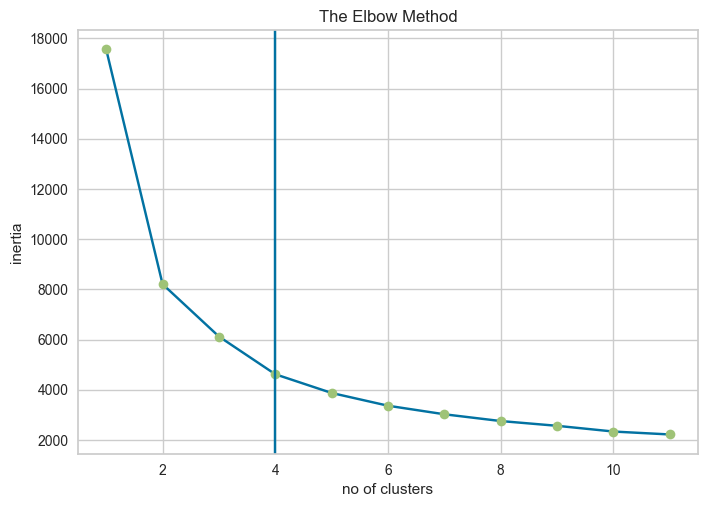

In [224]:
plt.plot(range(1,12), wcss,'-')
plt.plot(range(1,12), wcss,'o')
plt.title('The Elbow Method')
plt.xlabel('no of clusters')
plt.ylabel('inertia')
plt.axvline(4)
plt.show()
# from the elbow plot cluster formation at 3 clusters is better

In [225]:
ssd =[]

K = range(2, 12)

for k in K:
    model = KMeans(n_clusters=k)
    model.fit(rfm_scaled)
    
    ssd.append(model.inertia_)
    print(f'Silhouette Score for {k} clusters: {silhouette_score(rfm_scaled, model.labels_)}')

    # but silhoutte score is higher for 2 clusters 

Silhouette Score for 2 clusters: 0.43756062318670497
Silhouette Score for 3 clusters: 0.34321984465356153
Silhouette Score for 4 clusters: 0.3800154996573313
Silhouette Score for 5 clusters: 0.3451571813274592
Silhouette Score for 6 clusters: 0.3351222874725948
Silhouette Score for 7 clusters: 0.2956791550973372
Silhouette Score for 8 clusters: 0.29509067539320777
Silhouette Score for 9 clusters: 0.29870020973087713
Silhouette Score for 10 clusters: 0.2901739208348717
Silhouette Score for 11 clusters: 0.28414028118346196


visualize it using yellow bricks

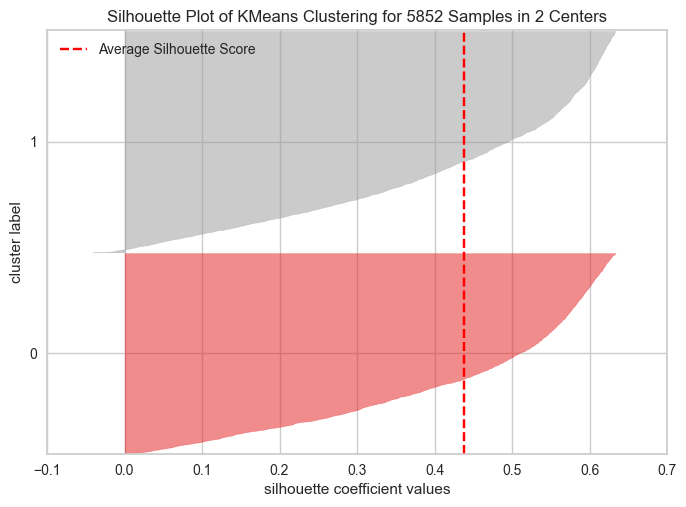

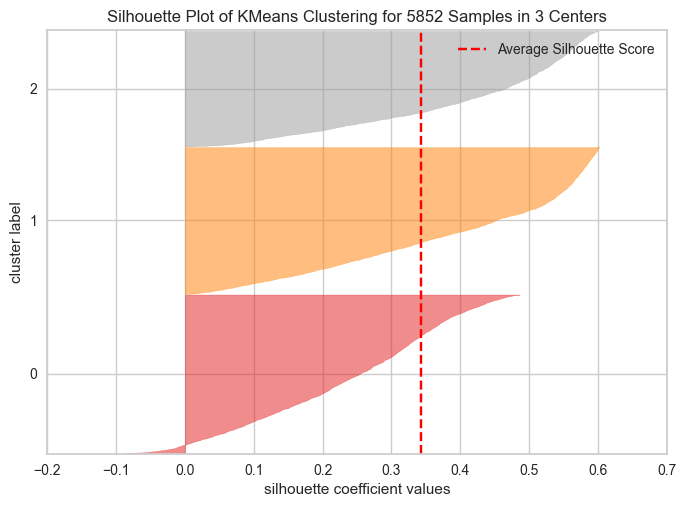

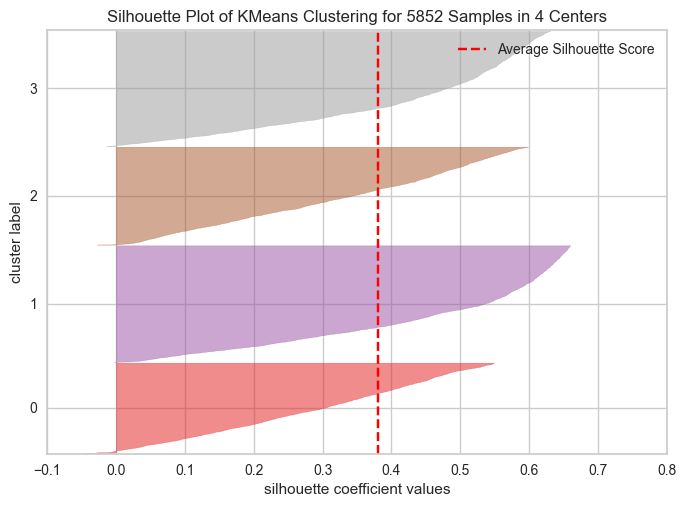

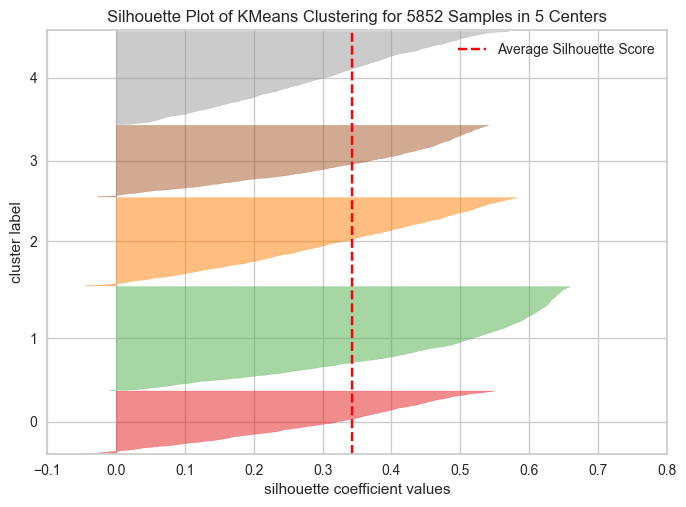

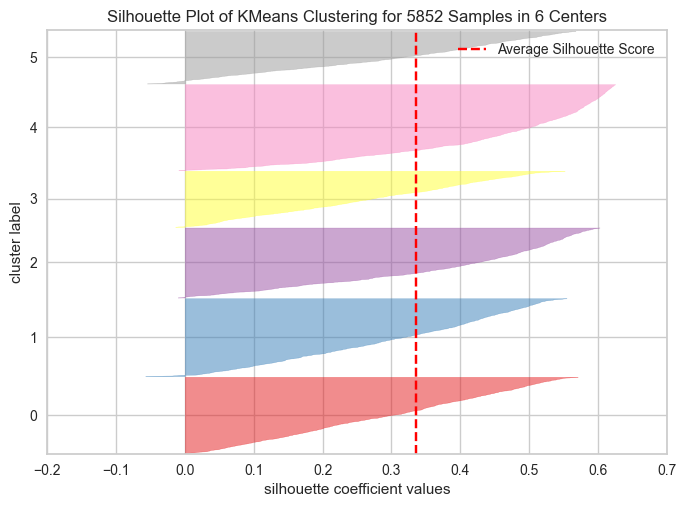

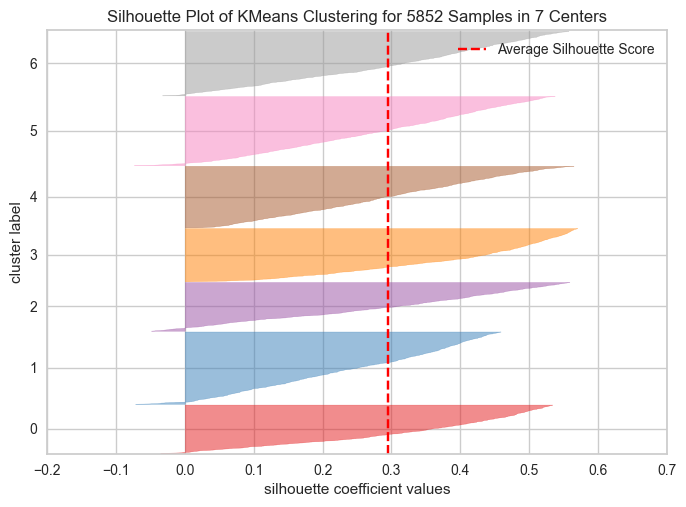

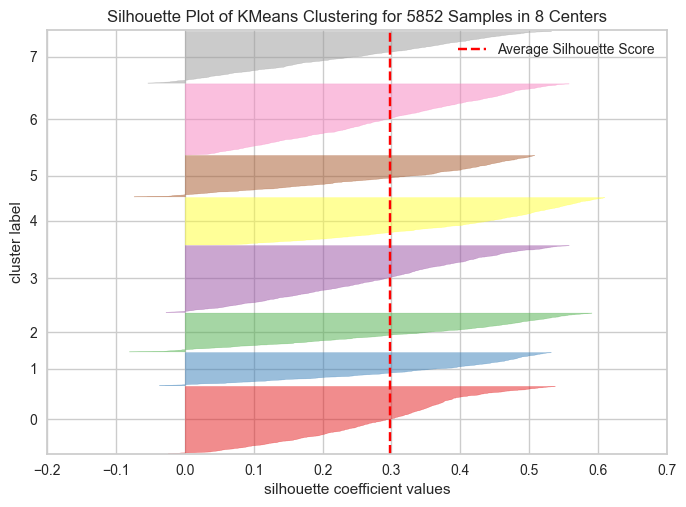

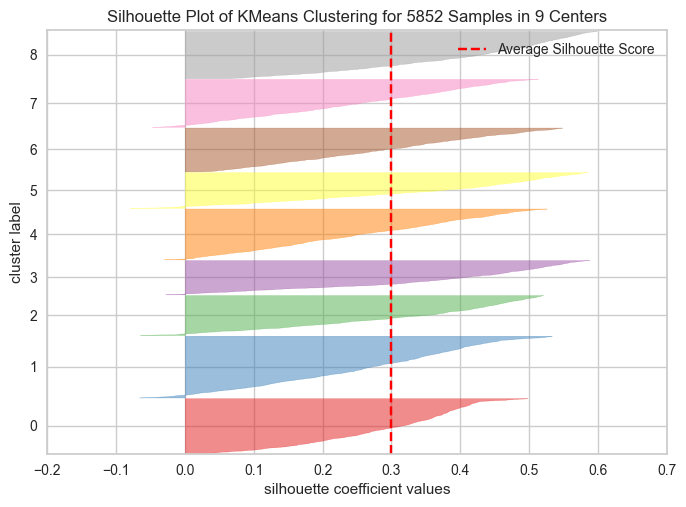

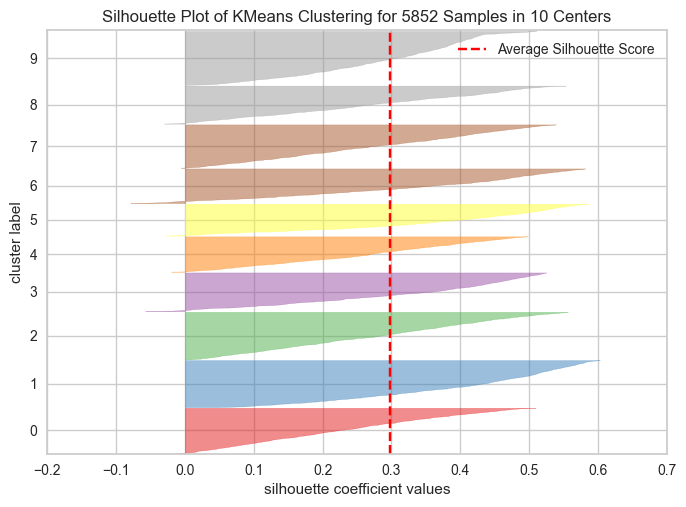

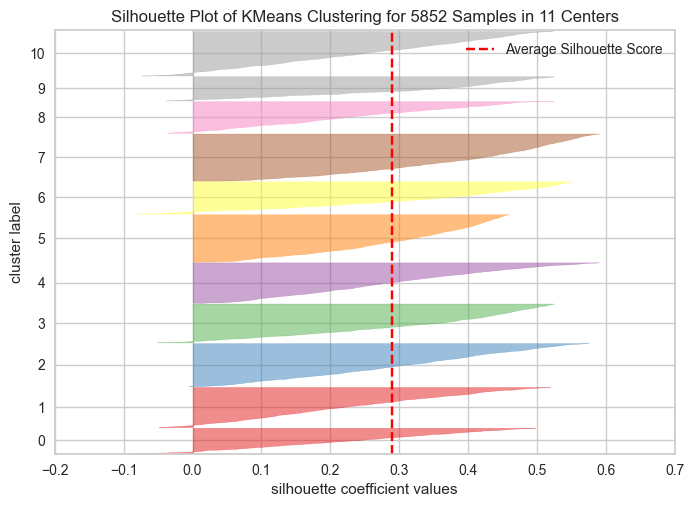

In [227]:
from yellowbrick.cluster import SilhouetteVisualizer
n=1
for i in range(2, 12):
    model = KMeans(n_clusters=i)
    visualizer = SilhouetteVisualizer(model)

    visualizer.fit(rfm_scaled)    
    visualizer.poof()

In [228]:
# compared to 2, 3 clusters have better clustering

In [239]:
# model fitting
kmeans = KMeans(n_clusters = 4,random_state=1).fit(rfm_scaled)
kmeans.fit_predict(rfm_scaled)
labels = kmeans.labels_
rfm_scaled['ClusterID']=labels
rfm_scaled

,recency,Frequency,Monetary,ClusterID
0,0.862252,-0.011139,2.889383,3
1,-1.761405,0.966796,1.289818,0
2,-0.213970,0.531303,0.458685,3
3,-0.995211,-0.011139,1.006616,0
4,0.822562,-1.264585,-0.816564,1
...,...,...,...,...
5847,-1.658983,1.673297,0.804519,0
5848,1.107037,-1.264585,-0.559746,1
5849,1.502682,-1.264585,-0.626704,1
5850,1.196368,-0.475012,0.256284,3


In [240]:
kmeans

KMeans(n_clusters=4, random_state=1)

In [241]:
rfm_scaled['ClusterID'].value_counts()

ClusterID
1    1629
0    1593
3    1377
2    1253
Name: count, dtype: int64

In [242]:
fig = px.pie( values = rfm_scaled['ClusterID'].value_counts(), 
             names = (rfm_scaled['ClusterID'].value_counts()).index, 
             title = 'Predicted Clusters Distribution')
fig.show()

In [250]:
customer_rfm1['Cluster'] = labels
customer_rfm1

,Customer ID,recency,Frequency,Monetary,Recency_Score,Frequency_Score,Monetary_Score,RFM_Score,Segment,Cluster,Labels
0,12346,325.0,3,77352.96,2,2,4,224,Top Customer Needed Attention,3,Silver Customers
1,12347,2.0,8,5633.32,4,3,4,434,Top Recent Customer,0,Platinum Customers
2,12348,75.0,5,1658.40,3,3,3,333,Top Loyal Customer,3,Silver Customers
3,12349,18.0,3,3678.69,4,2,4,424,Top Recent Customer,0,Platinum Customers
4,12350,310.0,1,294.40,2,1,1,211,Customer Needed Attention,1,Need action Customer
...,...,...,...,...,...,...,...,...,...,...,...
5847,18283,3.0,22,2730.70,4,4,4,444,Star Customer,0,Platinum Customers
5848,18284,431.0,1,411.68,1,1,2,112,Lost Customer,1,Need action Customer
5849,18285,660.0,1,377.00,1,1,2,112,Lost Customer,1,Need action Customer
5850,18286,476.0,2,1246.43,1,2,3,123,Top Lost Customer,3,Silver Customers


visualizing the clusters

<Axes: xlabel='recency', ylabel='Frequency'>

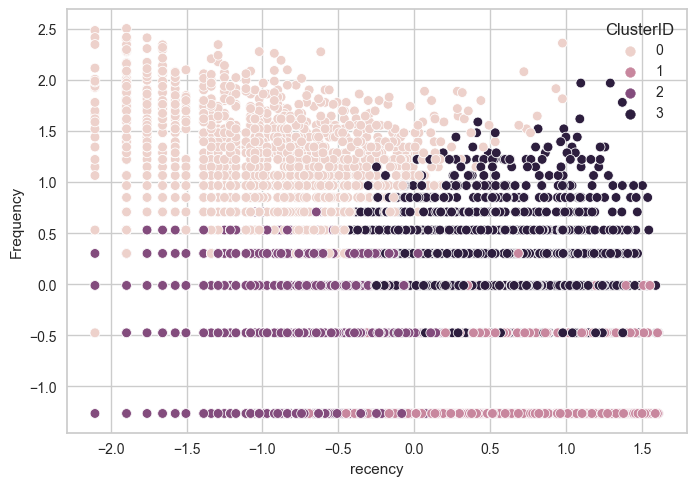

In [244]:
sns.scatterplot(x=rfm_scaled['recency'],y=rfm_scaled['Frequency'],hue=rfm_scaled['ClusterID'])

labeling

<Axes: xlabel='recency', ylabel='Monetary'>

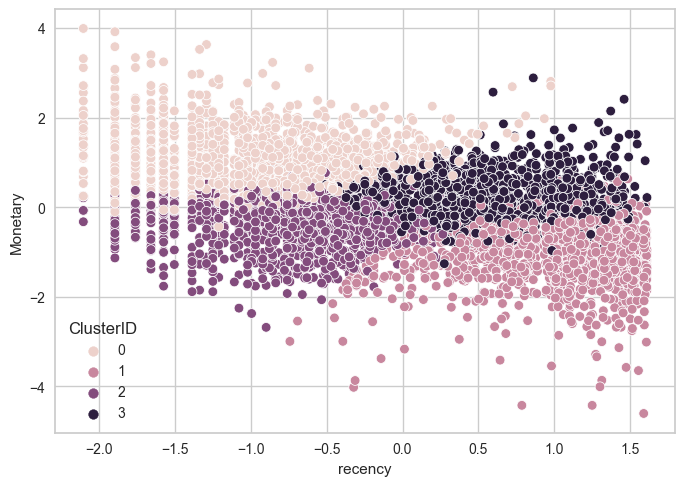

In [245]:
sns.scatterplot(x=rfm_scaled['recency'],y=rfm_scaled['Monetary'],hue=rfm_scaled['ClusterID'])

<Axes: xlabel='Frequency', ylabel='Monetary'>

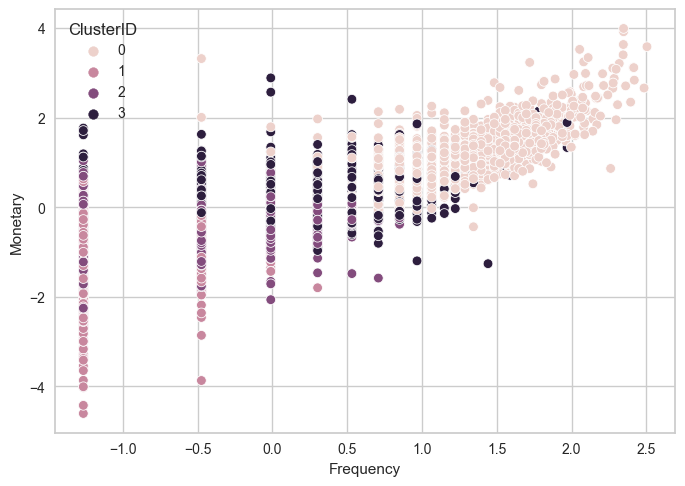

In [246]:
sns.scatterplot(x=rfm_scaled['Frequency'],y=rfm_scaled['Monetary'],hue=rfm_scaled['ClusterID'])

labeling the clusters formed, based on the business and segments

In [247]:
customer_rfm1.groupby('Cluster')['Segment'].value_counts()


Cluster  Segment                      
0        Star Customer                     842
         Top Recent Customer               402
         Top Loyal Customer                325
         Top Customer Needed Attention      16
         Recent Customer                     8
1        Lost Customer                    1032
         Customer Needed Attention         502
         Loyal Customer                     43
         Top Lost Customer                  30
         Top Customer Needed Attention      22
2        Loyal Customer                    491
         Recent Customer                   371
         Top Loyal Customer                174
         Top Recent Customer               159
         Customer Needed Attention          52
         Top Customer Needed Attention       6
3        Top Customer Needed Attention     506
         Customer Needed Attention         276
         Top Lost Customer                 250
         Top Loyal Customer                165
         Lost Custome

In [248]:
customer_rfm1['Labels'] = customer_rfm1['Cluster'].map({0:'Platinum Customers', 1:'Need action Customer', 2:'Gold Customer',3:'Silver Customers'})

In [249]:
customer_rfm1.head()

,Customer ID,recency,Frequency,Monetary,Recency_Score,Frequency_Score,Monetary_Score,RFM_Score,Segment,Cluster,Labels
0,12346,325.0,3,77352.96,2,2,4,224,Top Customer Needed Attention,3,Silver Customers
1,12347,2.0,8,5633.32,4,3,4,434,Top Recent Customer,0,Platinum Customers
2,12348,75.0,5,1658.40,3,3,3,333,Top Loyal Customer,3,Silver Customers
3,12349,18.0,3,3678.69,4,2,4,424,Top Recent Customer,0,Platinum Customers
4,12350,310.0,1,294.40,2,1,1,211,Customer Needed Attention,1,Need action Customer


In [252]:
fig = px.pie( values = customer_rfm1['Labels'].value_counts(), 
             names = (customer_rfm1['Labels'].value_counts()).index, 
             title = 'Predicted Clusters Distribution')
fig.show()

DB - Scan

In [253]:
from sklearn.cluster import DBSCAN

In [254]:
dbs=DBSCAN(eps=0.8, min_samples=5)
dbs.fit(rfm_scaled)

DBSCAN(eps=0.8)

In [255]:
rfm_scaled1=rfm_scaled.copy()

In [256]:
labels = dbs.labels_
rfm_scaled1['ClusterID']=labels
rfm_scaled1

,recency,Frequency,Monetary,ClusterID
0,0.862252,-0.011139,2.889383,-1
1,-1.761405,0.966796,1.289818,0
2,-0.213970,0.531303,0.458685,1
3,-0.995211,-0.011139,1.006616,0
4,0.822562,-1.264585,-0.816564,2
...,...,...,...,...
5847,-1.658983,1.673297,0.804519,0
5848,1.107037,-1.264585,-0.559746,2
5849,1.502682,-1.264585,-0.626704,2
5850,1.196368,-0.475012,0.256284,1


In [257]:
rfm_scaled.ClusterID.value_counts()

ClusterID
1    1629
0    1593
3    1377
2    1253
Name: count, dtype: int64

In [258]:
rfm_scaled1.ClusterID.value_counts()

ClusterID
 2    1628
 0    1591
 1    1372
 3    1252
-1       9
Name: count, dtype: int64

<Axes: xlabel='recency', ylabel='Frequency'>

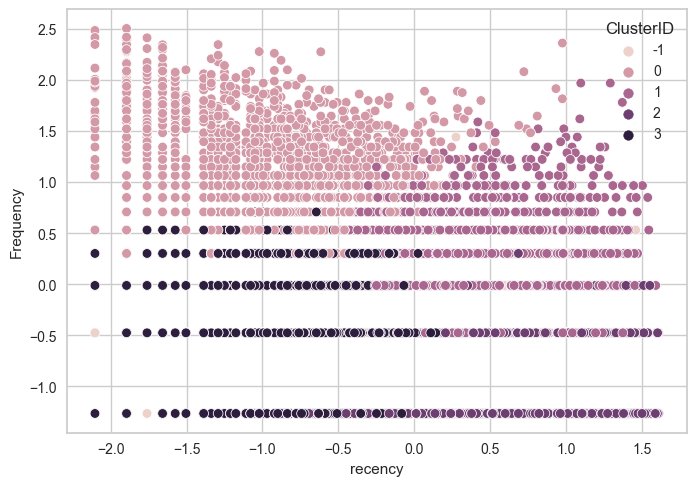

In [259]:
sns.scatterplot(x=rfm_scaled1['recency'],y=rfm_scaled1['Frequency'],hue=rfm_scaled1['ClusterID'])

<Axes: xlabel='recency', ylabel='Monetary'>

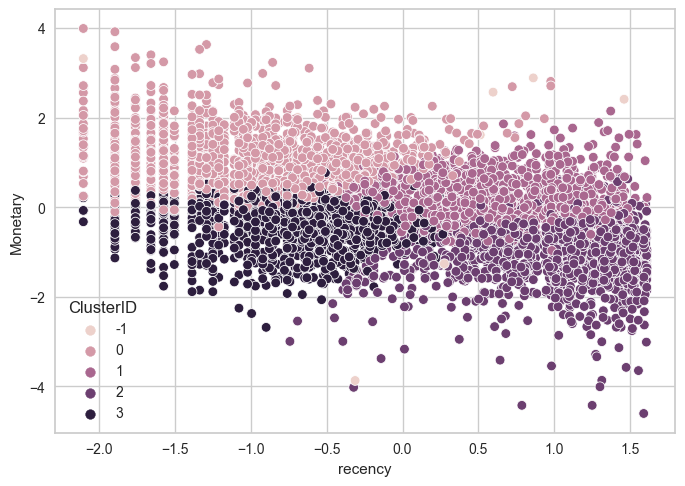

In [260]:
sns.scatterplot(x=rfm_scaled1['recency'],y=rfm_scaled1['Monetary'],hue=rfm_scaled1['ClusterID'])

<Axes: xlabel='Frequency', ylabel='Monetary'>

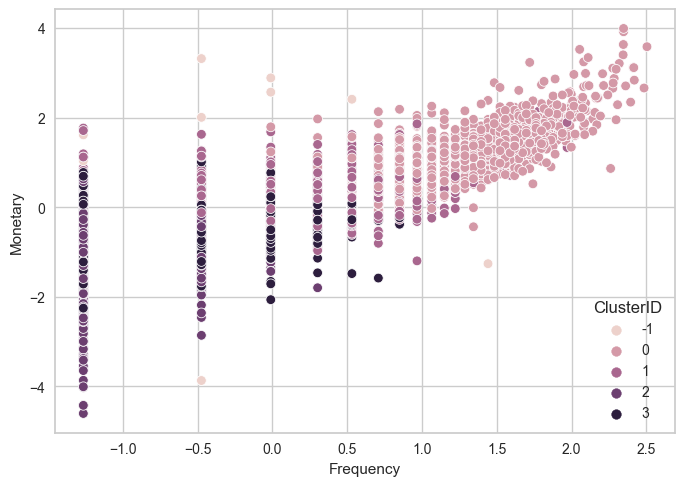

In [261]:
sns.scatterplot(x=rfm_scaled1['Frequency'],y=rfm_scaled1['Monetary'],hue=rfm_scaled1['ClusterID'])

- we can see that clusters formed using both db- scan and k-means clusters are almost similar
- only few data are not classified under any cluster while using dbscan